# Scraping for ideal data science competence profile
## Part one: First dip into the Soup

In this project:
1. We setup environment for web scraping with selenium and BautifulSoup in Google Colab.
2. We check the possibilities:
    2.1. We investigate one site to ger a grip of what web scraping is in the context of retrieving job offer data.
    2.2. We build an algorithm for this one concrete site.
3. We acquire data from job offerings in data science / machine learning domain.
4. We prepare raw data for summary.
5. We create a summary of most needed skills for data science / ML specialists.

After creating first report based on one site of choice, we will create a solution that can be generalized for many job sites.

**This notebook (Part One of the project) covers points 1 - 3.**



## 1. Setup the environment.

This section draws from this blogpost: https://nariyoo.com/python-how-to-run-selenium-in-google-colab/

In [ ]:
# Set up for running selenium in Google Colab
## You don't need to run this code if you do it in Jupyter notebook, or other local Python setting
%%shell
sudo apt -y update
sudo apt install -y wget curl unzip
wget http://archive.ubuntu.com/ubuntu/pool/main/libu/libu2f-host/libu2f-udev_1.1.4-1_all.deb
dpkg -i libu2f-udev_1.1.4-1_all.deb
wget https://dl.google.com/linux/direct/google-chrome-stable_current_amd64.deb
dpkg -i google-chrome-stable_current_amd64.deb
CHROME_DRIVER_VERSION=`curl -sS chromedriver.storage.googleapis.com/LATEST_RELEASE`
wget -N https://chromedriver.storage.googleapis.com/$CHROME_DRIVER_VERSION/chromedriver_linux64.zip -P /tmp/
unzip -o /tmp/chromedriver_linux64.zip -d /tmp/
chmod +x /tmp/chromedriver
mv /tmp/chromedriver /usr/local/bin/chromedriver
pip install selenium

Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Fetched 229 kB in 1s (171 kB/s)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
37 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists... Done
Building dependenc

In [ ]:
!pip install chromedriver-autoinstaller

import sys
sys.path.insert(0,'/usr/lib/chromium-browser/chromedriver')

import time
import pandas as pd
from bs4 import BeautifulSoup
from selenium import webdriver
import chromedriver_autoinstaller

# setup chrome options
chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')

# set path to chromedriver as per your configuration
chromedriver_autoinstaller.install()

'/usr/local/lib/python3.10/dist-packages/chromedriver_autoinstaller/122/chromedriver'

In [ ]:
data_path = 'drive/MyDrive/Colab Notebooks/ScrapingForIdeal'

In [ ]:
import re
import os

In [ ]:
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.common.by import By

In [ ]:
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

In [ ]:
SEED = 44

## 2. Inspect theprotocol.it for places where interesting data is

### 2.1. Example job offer page

---

**DISCLAIMER:**
Some work inspecting this page was already done (eg. possibility to crawl into other part of the site). Richer in experience: we will use /robots.txt and the sitemap for crawling.

---

In [ ]:
# Example job offer
theprotocol_it_example_offer = 'https://theprotocol.it/szczegoly/praca/data-scientist-warszawa,oferta,89230000-a28f-36f5-7cd5-08dc16e6f4ca?s=1953398486&searchId=0282e9d0-bd63-11ee-8796-ed7f1edc7059'

In [ ]:
# Initialize the Chrome driver
driver = webdriver.Chrome(options=chrome_options)

# Navigate to the webpage
driver.get(theprotocol_it_example_offer)

try:

    # Get the page source after Selenium has fully rendered the page
    page_source = driver.page_source

    # Pass the page source to BeautifulSoup
    soup = BeautifulSoup(page_source, 'html.parser')

    sexy_soup = soup.prettify()

    # Define a regular expression pattern to match the desired pattern
    pattern = re.compile(r"section-\w+")

    # Find all elements whose text matches the pattern
    matching_texts = pattern.findall(sexy_soup)

    # Print the matching texts
    print(matching_texts)

finally:
    # Make sure to close the WebDriver session to free up resources
    driver.quit()

['section-cookieModal', 'section-offerPreview', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section-expectedTechnologies', 'section-offerPreview', 'section

---

**TASK:**
It seems that theprotocol.it site has quite orderly structure and we can extract <div> tags with section names shown above nad check their content for interesting data

---

In [ ]:
# Initialize the Chrome driver
driver = webdriver.Chrome(options=chrome_options)

# Navigate to the webpage
driver.get("https://theprotocol.it/szczegoly/praca/data-scientist-warszawa,oferta,89230000-a28f-36f5-7cd5-08dc16e6f4ca")

# Get the page source after Selenium has fully rendered the page
page_source = driver.page_source

# Pass the page source to BeautifulSoup
soup = BeautifulSoup(page_source, 'html.parser')

for section_name in matching_texts:
  # Find the <div> element with the specified data-test attribute
  div_element = soup.find('div', {'data-test': section_name})

  # If the div_element is found, extract and print its plain text content
  if div_element:
      print(section_name + '\n' + '='*30)
      print(div_element.get_text(separator='\n').strip())  # Print the text content with newlines as separators

# Close the driver
driver.quit()

---

Qualitative research brings us to the list below:

---

In [ ]:
theprotocol_it_sections_of_interest = [
    'section-contract',
    'section-workplace',
    'section-technologies',
    'section-responsibilities',
    'section-requirements',
]

### 2.2. Sitemap page

In [ ]:
theprotocol_host_url = 'https://theprotocol.it/'

In [ ]:
# set up the webdriver
driver = webdriver.Chrome(options=chrome_options)

# go to /robots.txt
driver.get(theprotocol_host_url+'/robots.txt')

robots_source = driver.page_source

print(robots_source)

driver.quit()

<html><head><meta name="color-scheme" content="light dark"></head><body><pre style="word-wrap: break-word; white-space: pre-wrap;">User-agent: *
Disallow: /_next/

Sitemap: https://theprotocol.it/sitemap_index.xml
</pre></body></html>


In [ ]:
# set up the webdriver
driver = webdriver.Chrome(options=chrome_options)

# Fetch the sitemap XML
sitemap_url = "https://theprotocol.it/sitemap_index.xml"
driver.get(sitemap_url)
page_source = driver.page_source

# Parse the XML
sitemap_soup = BeautifulSoup(page_source, "xml")

# Extract URLs from the sitemap
data_urls = [loc.text for loc in sitemap_soup.find_all("loc") if ('learning' in loc.text ) or ('data' in loc.text) or ('ai' in loc.text)]

driver.quit()

In [ ]:
data_urls

['https://theprotocol.it/filtry/apache-airflow;t',
 'https://theprotocol.it/filtry/haiku;t',
 'https://theprotocol.it/filtry/oracle-data-integrato;t',
 'https://theprotocol.it/filtry/ruby-on-rails;t',
 'https://theprotocol.it/filtry/snowflake-data-cloud;t',
 'https://theprotocol.it/filtry/trainee;p',
 'https://theprotocol.it/filtry/ai-ml;sp',
 'https://theprotocol.it/filtry/big-data-science;sp',
 'https://theprotocol.it/zarobki/data-scientist',
 'https://theprotocol.it/praca?kw=data+center',
 'https://theprotocol.it/praca?kw=data+mining',
 'https://theprotocol.it/praca?kw=data+scientist',
 'https://theprotocol.it/praca?kw=master+data+management',
 'https://theprotocol.it/praca?kw=master+data',
 'https://theprotocol.it/praca?kw=teradata',
 'https://theprotocol.it/praca?kw=machine+learning',
 'https://theprotocol.it/filtry/ukraina;st']

In [ ]:
theprotocol_it_pages_of_interest = [
    'https://theprotocol.it/praca?kw=data+mining',
    'https://theprotocol.it/praca?kw=data+scientist',
    'https://theprotocol.it/praca?kw=machine+learning',
    'https://theprotocol.it/filtry/ai-ml;sp',
    'https://theprotocol.it/filtry/big-data-science;sp'
]

---

So we have two concise lists of where to look. Check these pages of interest for hooks to use in further crawler steps

---

### 2.3. List of offer pages

There
data-test="list-item-offer"

In [ ]:
# set up the webdriver
driver = webdriver.Chrome(options=chrome_options)

# Navigate to the webpage
driver.get(theprotocol_it_pages_of_interest[1])

# Get the page source after Selenium has fully rendered the page
page_source = driver.page_source

# Pass the page source to BeautifulSoup
soup = BeautifulSoup(page_source, 'html.parser')

# Find the <div> element with the specified data-test attribute
div_elements = soup.find_all('a', {'data-test': 'list-item-offer'})

div_element = div_elements[np.random.randint(len(div_elements))]
print(div_element)

# try to crawl

print(f'\nTrying to crawl into {driver.current_url}')
driver.get(theprotocol_host_url + div_element['href'])
print(f'\nCurrently at: {driver.current_url}')

# If the div_element is found, extract and print its plain text content
'''
if div_element:
    print(div_element.get_text(separator='\n').strip())  # Print the text content with newlines as separators
'''
# Close the driver
driver.quit()

<a aria-label="oferta pracy - Analityk Danych" class="anchorClass_aqdsolh" data-rangeaddon="false" data-selected="false" data-test="list-item-offer" data-test-groupid="092cff5c-cac4-ee11-bea0-000d3a20bb67" data-test-selected="false" href="/szczegoly/praca/analityk-danych-warszawa,oferta,906b0000-87bb-72e1-0f57-08dc26ee41cf?searchId=5ef21870-d858-11ee-8ea7-7b8b030ad9b5&amp;s=-2109747570" tabindex="0"><div class="mainWrapper_m12z7gd6" data-small="false" data-test="section-offerPreview" data-test-loading="false" data-test-offerurlname="analityk-danych-warszawa,oferta,906b0000-87bb-72e1-0f57-08dc26ee41cf"><div class="GridElement_g16c3y1q" style="--grid-xs: NaN; --grid-sm: NaN; --grid-md: NaN; --grid-lg: NaN; --grid-xl: NaN; --grid-xxl: NaN;"><div class="companyLogo_c17z056z" data-logo="true" data-small="false"><img alt="" data-test="icon-companyLogo" loading="lazy" src="https://logos.gpcdn.pl/loga-firm/20014183/9b030000-5dac-0015-8242-08da65727500_280x280.png?width=96"/></div></div><div cl

---

So, we know that these pages listed on the sitemp are navigable.
Now we need to find a way to separte strictly DS/ML/DL jobs.
Let's find out, what are the position names.

---

### 2.3.1. Position names

#### 2.3.1.1. Retrieve position names from job offer listings

In [ ]:
# crete a dict variable to populate
list_of_position_names = dict()

# set to the driver
driver = webdriver.Chrome(options=chrome_options)

for url in theprotocol_it_pages_of_interest:
  driver.get(url)

  print(f'Checking {url}')

  page_source = driver.page_source

  soup = BeautifulSoup(page_source, 'html.parser')

  matching_elements = soup.find_all('a', {'data-test': 'list-item-offer'})

  list_of_position_names[url] = [element.text for element in matching_elements]

driver.quit()


Checking https://theprotocol.it/praca?kw=data+mining
Checking https://theprotocol.it/praca?kw=data+scientist
Checking https://theprotocol.it/praca?kw=machine+learning
Checking https://theprotocol.it/filtry/ai-ml;sp
Checking https://theprotocol.it/filtry/big-data-science;sp


In [ ]:
[k for k, v  in list_of_position_names.items() if len(v) == 0]

['https://theprotocol.it/praca?kw=data+mining',
 'https://theprotocol.it/praca?kw=data+scientist',
 'https://theprotocol.it/filtry/ai-ml;sp',
 'https://theprotocol.it/filtry/big-data-science;sp']

---

For some reason our algorithm does not catch content from every site of interest. However, we know (from earlier trials) that urls that has empty lists for values vary from execution to execution.
We will use recurrent algorithm that will execute n trials, so to fill

---

In [ ]:
def browse_pages_off_interest_till_filled(list_of_pages, trials = 15):

  for url in list_of_pages:
    driver.get(url)

    print(f'Checking {url}')

    page_source = driver.page_source

    soup = BeautifulSoup(page_source, 'html.parser')

    matching_elements = soup.find_all('a', {'data-test': 'list-item-offer'})

    list_of_position_names[url] = [element.text for element in matching_elements]

  list_of_pages = [k for k, v  in list_of_position_names.items() if len(v) == 0]


  if len(list_of_pages) == 0:
    print('All of the value lists were populated')
  elif trials==0:
    print(f'Algortihm performed all trials and will shut down')
  else:
    browse_pages_off_interest_till_filled(list_of_pages, trials-1)

In [ ]:
list_of_position_names = dict()

# set to the driver
driver = webdriver.Chrome(options=chrome_options)

browse_pages_off_interest_till_filled(theprotocol_it_pages_of_interest, trials=20)

driver.quit()

Checking https://theprotocol.it/praca?kw=data+mining
Checking https://theprotocol.it/praca?kw=data+scientist
Checking https://theprotocol.it/praca?kw=machine+learning
Checking https://theprotocol.it/filtry/ai-ml;sp
Checking https://theprotocol.it/filtry/big-data-science;sp
Checking https://theprotocol.it/praca?kw=data+mining
Checking https://theprotocol.it/praca?kw=data+scientist
Checking https://theprotocol.it/praca?kw=machine+learning
Checking https://theprotocol.it/filtry/ai-ml;sp
Checking https://theprotocol.it/filtry/big-data-science;sp
Checking https://theprotocol.it/praca?kw=data+mining
Checking https://theprotocol.it/praca?kw=data+scientist
Checking https://theprotocol.it/filtry/ai-ml;sp
Checking https://theprotocol.it/filtry/big-data-science;sp
Checking https://theprotocol.it/praca?kw=data+mining
Checking https://theprotocol.it/praca?kw=data+scientist
Checking https://theprotocol.it/filtry/ai-ml;sp
Checking https://theprotocol.it/filtry/big-data-science;sp
Checking https://the

In [ ]:
[len(v) for v in list_of_position_names.values()]

[2, 53, 53, 53, 53]

#### 2.3.1.2. Tokenize gathered data

In [ ]:
import nltk
from nltk.util import ngrams
from nltk.probability import FreqDist

def tokenize_data(data):
    archive = {
      '1-grams':[],
      '2-grams':[],
      '3-grams':[],
    }
    for item in data:
        tokens = item.split()  # Tokenize by space
        tokens = [token for token in tokens if (len(token) <= 14) and (len(token) > 1) and token.isalpha() and token[0].isupper()]  # Filter tokens longer than 14 characters and tokens with non-letter characters
        # Generate single words, 2-grams, and 3-grams
        archive['1-grams'].extend(list(ngrams(tokens, 1)))
        archive['2-grams'].extend(list(ngrams(tokens, 2)))
        archive['3-grams'].extend(list(ngrams(tokens, 3)))
    return archive

def compute_statistics(tokenized_data):
    stat_dict_per_link = {}
    for url, gram_dict in tokenized_data.items():
        statistics = {}
        for key, value in gram_dict.items():
            if key not in statistics:
                statistics[key] = FreqDist()
            statistics[key].update(value)

        stat_dict_per_link[url] = statistics

    return stat_dict_per_link

In [ ]:
tokenized_data_per_link = dict()

for k, v in list_of_position_names.items():
  tokenized_data_per_link[k] = tokenize_data(v)

In [ ]:
tokenized_data_per_link[list(tokenized_data_per_link.keys())[0]]['1-grams'][:175] == tokenized_data_per_link[list(tokenized_data_per_link.keys())[1]]['1-grams'][:175]

False

In [ ]:
statistics = compute_statistics(tokenized_data_per_link)

In [ ]:
engram_per_link_df =  pd.DataFrame(statistics)

In [ ]:
engram_per_link_df

,https://theprotocol.it/praca?kw=data+mining,https://theprotocol.it/praca?kw=data+scientist,https://theprotocol.it/praca?kw=machine+learning,https://theprotocol.it/filtry/ai-ml;sp,https://theprotocol.it/filtry/big-data-science;sp
1-grams,"{('Analityk',): 1, ('Data',): 1, ('MiningCredi...","{('Machine',): 11, ('Learning',): 13, ('Engine...","{('Machine',): 13, ('Learning',): 17, ('Engine...","{('Automation',): 1, ('Test',): 1, ('Prądnik',...","{('Data',): 29, ('PolskaAzure',): 1, ('Factory..."
2-grams,"{('Analityk', 'Data'): 1, ('Data', 'MiningCred...","{('Machine', 'Learning'): 11, ('Learning', 'En...","{('Machine', 'Learning'): 13, ('Learning', 'En...","{('Automation', 'Test'): 1, ('Test', 'Prądnik'...","{('Data', 'PolskaAzure'): 1, ('PolskaAzure', '..."
3-grams,"{('Analityk', 'Data', 'MiningCredit'): 1, ('Da...","{('Machine', 'Learning', 'Engineerlast'): 1, (...","{('Machine', 'Learning', 'Engineerlast'): 1, (...","{('Automation', 'Test', 'Prądnik'): 1, ('Softw...","{('Data', 'PolskaAzure', 'Data'): 1, ('PolskaA..."


In [ ]:
engram_per_link_df.to_csv(os.path.join(data_path, 'retrieved_ngrams.csv'))

#### 2.3.1.3. Visualize data about positions

In [ ]:
# Set the style parameters for this project
dark_green = sns.color_palette("dark:#5A9_r", as_cmap=True)
custom = {"grid.linestyle": "dashed",
          "grid.color": "darkgrey",
          'grid.linewidth': 0.3,
          'patch.linewidth': 1.15,}
sns.set_style("whitegrid", rc = custom)

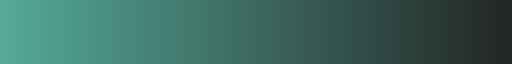

In [ ]:
dark_green

In [ ]:
# Create labels for the plot
label_dict = {}
for idx, element in enumerate(engram_per_link_df.iloc[:, 1:].items()):
  label_dict[idx] = zip([element[0] for x in range(4)], element[1].index)

label_frame = pd.DataFrame(label_dict)

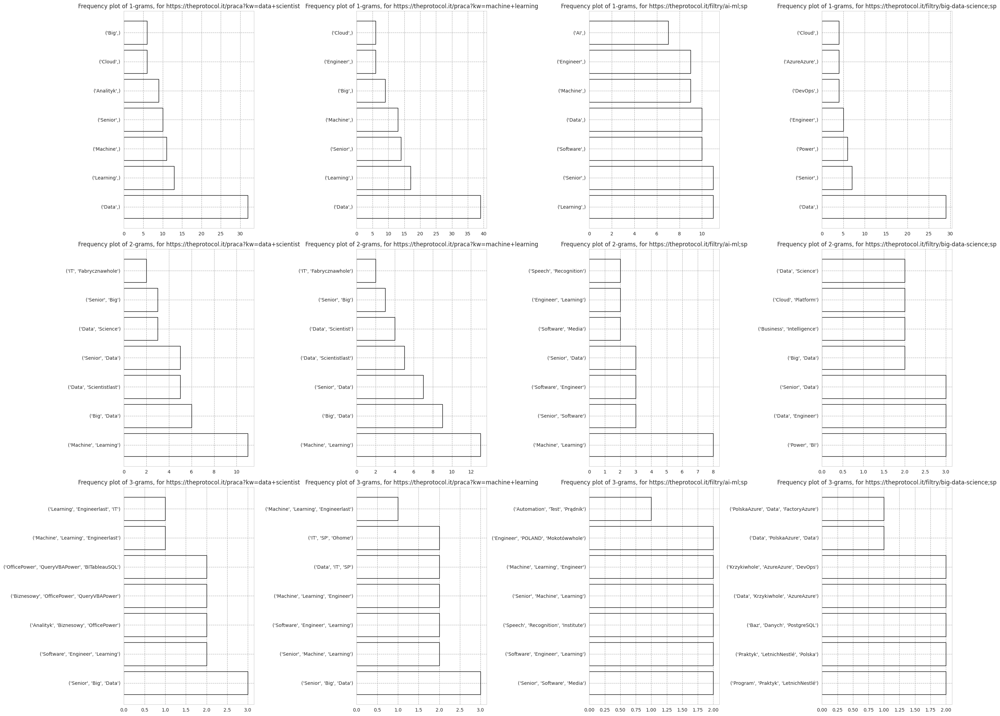

In [ ]:
# Plot most common ngrams for each scrapped page

fig, axs = plt.subplots(
    ncols=4,
    nrows=3,
    figsize=(7*4, 7*3)
)

for data, ax, annotation in zip(engram_per_link_df.iloc[:, 1:].to_numpy().flatten(), axs.flatten(), label_frame.to_numpy().flatten()):
  data = pd.DataFrame(list(data.most_common(7)), columns = ['ngrams', 'count'])

  ax.barh( data['ngrams'].astype(str).to_numpy(), data['count'], facecolor='none', edgecolor='black')
  ax.set_title(f'Frequency plot of {annotation[1]}, for {annotation[0]}')

plt.tight_layout()
plt.show()

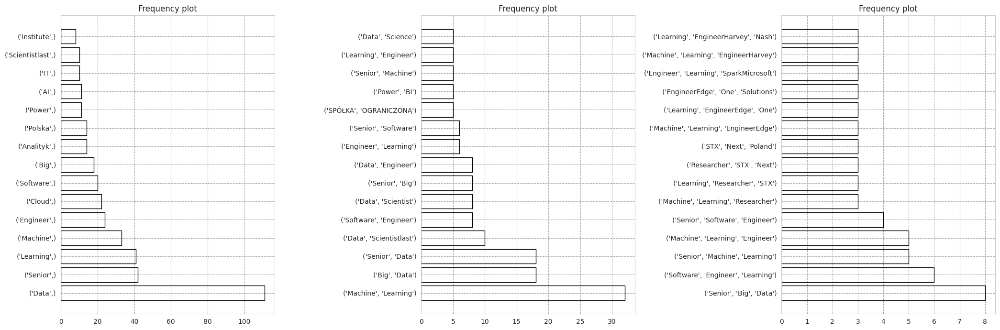

In [ ]:
# Plot most common ngrams for each type of engram
sns.set_style("whitegrid", rc = custom)
fig, axs = plt.subplots(
    ncols=3,
    nrows=1,
    figsize=(7*3, 7*1)
)

for data, ax in zip(engram_per_link_df.agg(sum, axis=1).to_numpy().flatten(), axs.flatten()):
  data = pd.DataFrame(list(data.most_common(15)), columns = ['ngrams', 'count'])

  ax.barh( data['ngrams'].astype(str).to_numpy(), data['count'], facecolor='none', edgecolor='black')
  ax.set_title(f'Frequency plot')

plt.tight_layout()
plt.show()

In [ ]:
list_of_all_tuples = []

for x in list(pd.DataFrame(tokenized_data_per_link).to_numpy().flatten()):
  list_of_all_tuples.extend(x)

In [ ]:
list_of_all_strings = [' '.join(tup).lower() for tup in list_of_all_tuples ]

In [ ]:
list_of_all_strings[:15]

['analityk',
 'data',
 'miningcredit',
 'agricole',
 'bank',
 'polska',
 'machine',
 'learning',
 'engineerlast',
 'it',
 'fabrycznawhole',
 'analityk',
 'danychbalton',
 'machine',
 'learning']

In [ ]:
from collections import Counter

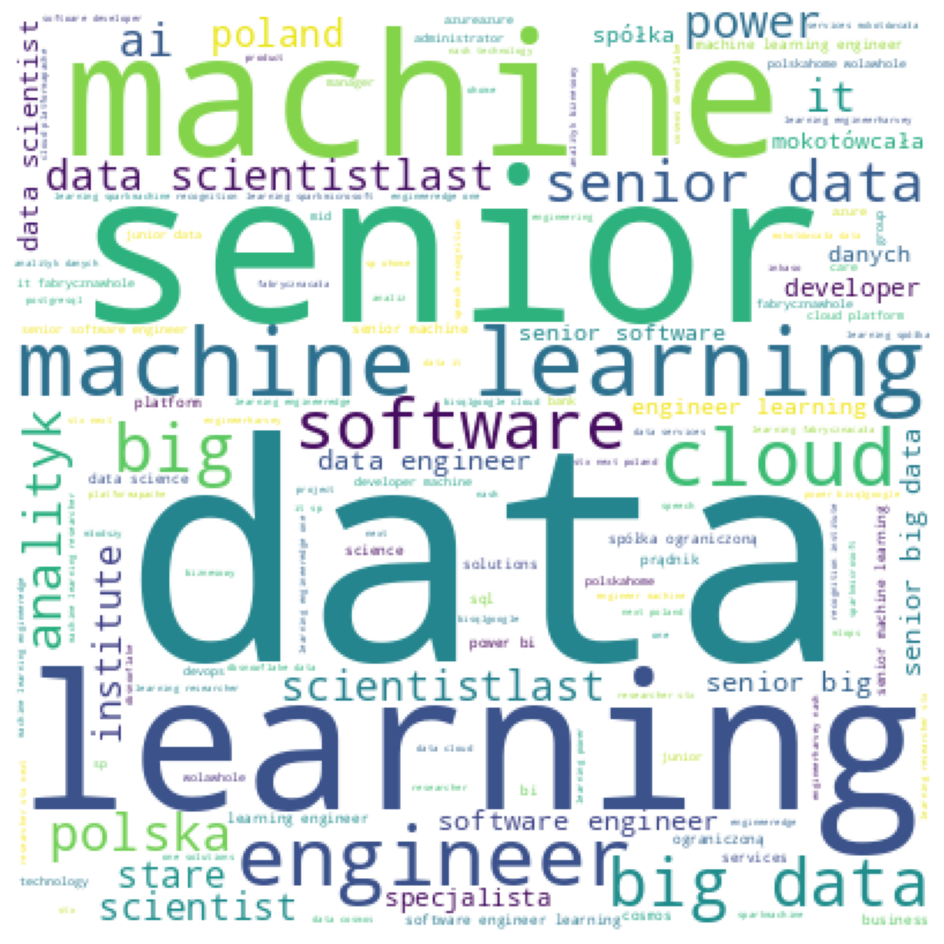

In [ ]:
#generating the wordcloud
wordcloud = WordCloud(
    background_color="white",
    height=400,
    width=400
    ).generate_from_frequencies(Counter(list_of_all_strings),)

#plot the wordcloud
plt.figure(figsize = (12, 12))
plt.imshow(wordcloud)

#to remove the axis value
plt.axis("off")
plt.show()

In [ ]:
list_of_position_words = Counter(list_of_all_strings).most_common(40)
list_of_position_words

[('data', 111),
 ('senior', 42),
 ('learning', 41),
 ('machine', 33),
 ('machine learning', 32),
 ('engineer', 24),
 ('cloud', 22),
 ('software', 20),
 ('big', 18),
 ('big data', 18),
 ('senior data', 18),
 ('analityk', 14),
 ('polska', 14),
 ('power', 11),
 ('ai', 11),
 ('it', 10),
 ('scientistlast', 10),
 ('data scientistlast', 10),
 ('poland', 8),
 ('institute', 8),
 ('stare', 8),
 ('scientist', 8),
 ('software engineer', 8),
 ('data scientist', 8),
 ('senior big', 8),
 ('data engineer', 8),
 ('senior big data', 8),
 ('developer', 7),
 ('specjalista', 7),
 ('spółka', 6),
 ('mokotówcała', 6),
 ('danych', 6),
 ('engineer learning', 6),
 ('senior software', 6),
 ('software engineer learning', 6),
 ('solutions', 5),
 ('ograniczoną', 5),
 ('bi', 5),
 ('platform', 5),
 ('sql', 5)]

First glance: nothing surprising, but the frequency of term 'senior' is very telling about the state of the job market.

### 3. Retrieve and store the data

### 3.1. Build the function to create an archive

In [ ]:
def build_archive(columns):
  return pd.DataFrame(columns=columns)


In [ ]:
the_protocol_df = build_archive(columns=theprotocol_it_sections_of_interest+['title', 'link'])

In [ ]:
the_protocol_df.empty

True

### 3.2. Build the function to retrive the data

In [ ]:
def retrieve_data(driver):
  page_source = driver.page_source

  # Pass the page source to BeautifulSoup
  soup = BeautifulSoup(page_source, 'html.parser')

  data_portion_df = build_archive(columns=theprotocol_it_sections_of_interest+['title', 'link'])

  # Get the title tag
  title_tag = soup.title

  # Extract the text of the title tag
  page_title = title_tag.text if title_tag else "No title found"

  for section_name in theprotocol_it_sections_of_interest:
    try:
      # Find the <div> element with the specified data-test attribute
      div_element = soup.find('div', {'data-test': section_name})
      data_portion_df[section_name] = [div_element.get_text(separator='\n').strip()]
    except Exception as e:
      print(e)
      data_portion_df[section_name] = [e]
    finally:
      data_portion_df['title'] = page_title

      # Get the link
      data_portion_df['link'] = driver.current_url
      continue
  return data_portion_df

In [ ]:
def is_empty(df):
  return df.empty

### 3.3. Build the function to append data portion to the archive

In [ ]:
def append_archive(df, data_portion):
  data_portion.columns = df.columns
  if data_portion.title[0] in df.title:
    return df
  else:
    df = pd.concat([df, data_portion], ignore_index=True)
    return df

### 3.4. Create a function to save an archive with timestamp in the name

In [ ]:
from datetime import datetime

now = datetime.now()

current_time = now.strftime("%Y_%m_%d__%H_%M_%S")
print("Current Time =", current_time)

Current Time = 2024_03_02__05_49_37


In [ ]:
def save_with_timestamp(df, data_path, filename_prefix):
  now = datetime.now()
  current_time = now.strftime("%Y_%m_%d__%H_%M_%S")
  filename = filename_prefix + '_' + current_time + '.csv'
  try:
    df.to_csv(os.path.join(data_path, f'{filename}'))
    print(f'{filename} successfully saved')
  except Exception as e:
    print(e)
    print(f'Failed to save: {filename}')
  finally:
    pass


## 4. Create a crawler algorithm

The crawler algorithm will do as follows:

1. Create an archive.
2. Start from a starting point offer
3. Retrieve data.
4. Append data.

---

5. Step outside to offer list page.
6. Find an offer at random.
7. Check if offer url not in archive.
8. Back to step six OR step into an offer.
9. Retrieve data.
10. Append data. Back to step 5. Do until timeout reached.



In [ ]:
# set up the webdriver
driver = webdriver.Chrome(options=chrome_options)

# Navigate to the webpage
driver.get(theprotocol_it_pages_of_interest[1])

print(f'\nCurrently at {driver.current_url}')

# Get the page source after Selenium has fully rendered the page
page_source = driver.page_source

# Pass the page source to BeautifulSoup
soup = BeautifulSoup(page_source, 'html.parser')

div_elements = soup.find_all('a', {'data-test': 'list-item-offer'})
print(div_elements)

div_element = div_elements[np.random.randint(len(div_elements))]
print(div_element)

# try to crawl
driver.get(theprotocol_host_url + div_element['href'])
print(f'\nCurrently at: {driver.current_url}')

data_portion = retrieve_data(driver)
print(data_portion)
if data_portion.empty:
  print('Nothing was retrieved')
else:
  the_protocol_df = append_archive(data_portion=data_portion, df=the_protocol_df)

print(the_protocol_df)

# Close the driver
driver.quit()


Currently at https://theprotocol.it/praca?kw=data+scientist
[<a aria-label="job offer - Machine Learning Engineer" class="anchorClass_aqdsolh" data-rangeaddon="false" data-selected="false" data-test="list-item-offer" data-test-groupid="f4df29c4-cdc1-ee11-bea0-000d3a20bb67" data-test-selected="false" href="/szczegoly/praca/machine-learning-engineer-wroclaw-wagonowa-2d,oferta,906b0000-87bb-72e1-990e-08dc23f1a8f8?searchId=a9481820-d858-11ee-a725-ad3f9de9279f&amp;s=-2109747570" tabindex="0"><div class="mainWrapper_m12z7gd6" data-small="false" data-test="section-offerPreview" data-test-loading="false" data-test-offerurlname="machine-learning-engineer-wroclaw-wagonowa-2d,oferta,906b0000-87bb-72e1-990e-08dc23f1a8f8"><div class="GridElement_g16c3y1q" style="--grid-xs: NaN; --grid-sm: NaN; --grid-md: NaN; --grid-lg: NaN; --grid-xl: NaN; --grid-xxl: NaN;"><div class="companyLogo_c17z056z" data-logo="true" data-small="false"><img alt="" data-test="icon-companyLogo" loading="lazy" src="https://lo

### 4.1. Create step_into_offer function.

In [ ]:
def step_into_offer(driver):
  # Check if crawler is at proper site
  if driver.current_url in theprotocol_it_pages_of_interest:
    try:
      # Pass the page source to BeautifulSoup
      soup = BeautifulSoup(page_source, 'html.parser')

      # Find the <div> element with the specified data-test attribute
      div_list = soup.find_all('a', {'data-test': 'list-item-offer'})
      random_number = np.random.randint(len(div_list))
      div_element = div_list[random_number]
      driver.get(theprotocol_host_url + div_element['href'])
    except Exception as e:
      print(e)
    finally:
      print(f'\nCurrently at: {driver.current_url}')
  else:
    print('Still at offer list') # the structure checking if on listing page to be functionalized with solution preventing algorithm from stucking at listing page


In [ ]:
theprotocol_it_pages_of_interest

['https://theprotocol.it/praca?kw=data+mining',
 'https://theprotocol.it/praca?kw=data+scientist',
 'https://theprotocol.it/praca?kw=machine+learning',
 'https://theprotocol.it/filtry/ai-ml;sp',
 'https://theprotocol.it/filtry/big-data-science;sp']

### 4.2. Create step_into_listings funtion

In [ ]:
def step_into_listings(driver):
  # Check if crawler is at proper site
  if driver.current_url in theprotocol_it_pages_of_interest:
    print('Still at offer list') # the structure checking if on listing page to be functionalized with solution preventing algorithm from stucking at listing page
  else:
    try:
      random_number = np.random.randint(len(theprotocol_it_pages_of_interest))
      driver.get(theprotocol_it_pages_of_interest[random_number])
    except Exception as e:
      print(e)
    finally:
      print(f'\nCurrently at: {driver.current_url}')


### 4.3. Execute crawler.


1. Create an archive.
2. Start from a starting point offer
3. Retrieve data.
4. Append data.

---

5. Step outside to offer list page.
6. Find an offer at random.
7. Check if offer url not in archive.
8. Back to step six OR step into an offer.
9. Retrieve data.
10. Append data. Back to step 5. Do until timeout reached.

# BELOW IS THE CRAWLER

In [ ]:
# Create an archive
## the_protocol_df is our archive

# Setup a starting offer
start_point = 'https://theprotocol.it/szczegoly/praca/data-scientist-krakow-fabryczna-1,oferta,51760000-8d01-36a5-bbab-08dc11d3272a'

# set up the webdriver
driver = webdriver.Chrome(options=chrome_options)

driver.get(start_point)

data_portion = retrieve_data(driver)

the_protocol_df = append_archive(data_portion=data_portion, df=the_protocol_df)

for iteration in range(100):
  step_into_listings(driver)
  step_into_offer(driver)
  data_portion = retrieve_data(driver)
  the_protocol_df = append_archive(data_portion=data_portion, df=the_protocol_df)

save_with_timestamp(the_protocol_df, data_path, 'theprotocol_it')

driver.quit()

'NoneType' object has no attribute 'get_text'
'NoneType' object has no attribute 'get_text'
'NoneType' object has no attribute 'get_text'
'NoneType' object has no attribute 'get_text'
'NoneType' object has no attribute 'get_text'

Currently at: https://theprotocol.it/filtry/ai-ml;sp

Currently at: https://theprotocol.it/szczegoly/praca/analityk-danych-warszawa,oferta,906b0000-87bb-72e1-0f57-08dc26ee41cf?searchId=a9481820-d858-11ee-a725-ad3f9de9279f&s=-2109747570

Currently at: https://theprotocol.it/praca?kw=data+scientist

Currently at: https://theprotocol.it/szczegoly/praca/mid-big-data-engineer-warszawa,oferta,26690000-cb14-7e1c-e528-08dc2e7a20d1?searchId=a9481820-d858-11ee-a725-ad3f9de9279f&s=-2109747570

Currently at: https://theprotocol.it/filtry/ai-ml;sp

Currently at: https://theprotocol.it/szczegoly/praca/data-scientist-engineer-poznan,oferta,79460000-18e0-1e00-d4a4-08dc38b140f4?searchId=a9481820-d858-11ee-a725-ad3f9de9279f&s=-2109747570

Currently at: https://theprotocol.it/p

#### AND HERE IS THE CODE TO LOAD THE DATA

In [ ]:
os.listdir(data_path)

['theprotocol_it_2024_02_10__12_07_25.csv',
 'theprotocol_it_2024_02_07__18_02_44.csv',
 'theprotocol_it.csv',
 'theprotocol_it_2024_02_02__22_08_46.csv',
 'working_file.csv',
 'theprotocol_it_2024_02_11__09_20_12.csv',
 'theprotocol_it_2024_02_22__13_30_34.csv',
 'theprotocol_it_2024_02_23__10_53_47.csv',
 'theprotocol_it_2024_02_24__13_14_06.csv',
 'theprotocol_it_2024_02_25__09_33_57.csv',
 'retrieved_ngrams.csv',
 'theprotocol_it_2024_02_28__19_23_53.csv',
 'theprotocol_it_2024_02_28__20_00_02.csv',
 'working_file_2024_02_11.csv',
 'working_file_2024_02_28.csv',
 'theprotocol_it_2024_03_02__05_27_58.csv',
 'theprotocol_it_2024_03_02__06_10_38.csv']

In [ ]:
# Load older archives
the_protocol_df_1 = pd.read_csv(os.path.join(data_path, 'theprotocol_it_2024_02_07__18_02_44.csv'), index_col=0)
the_protocol_df_2 = pd.read_csv(os.path.join(data_path, 'theprotocol_it.csv'), index_col=0)
the_protocol_df_3 = pd.read_csv(os.path.join(data_path, 'theprotocol_it_2024_02_02__22_08_46.csv'), index_col=0)
the_protocol_df_4 = pd.read_csv(os.path.join(data_path, 'theprotocol_it_2024_02_11__09_20_12.csv'), index_col=0)
the_protocol_df_5 = pd.read_csv(os.path.join(data_path, 'theprotocol_it_2024_02_22__13_30_34.csv'), index_col=0)
the_protocol_df_6 = pd.read_csv(os.path.join(data_path, 'theprotocol_it_2024_02_23__10_53_47.csv'), index_col=0)
the_protocol_df_7 = pd.read_csv(os.path.join(data_path, 'theprotocol_it_2024_02_24__13_14_06.csv'), index_col=0)
the_protocol_df_8 = pd.read_csv(os.path.join(data_path, 'theprotocol_it_2024_02_25__09_33_57.csv'), index_col=0)

In [ ]:
pd.concat([the_protocol_df_1, the_protocol_df_2, the_protocol_df_3, the_protocol_df_4, the_protocol_df_5, the_protocol_df_7, the_protocol_df_8, the_protocol_df]).drop_duplicates(subset='link', ignore_index=True).shape

(339, 7)

### 4.4. Remove dupliactes

For some rason our if statement that is there to prevent from appending duplicate entries to the archive does not work...

In [ ]:
working_df = pd.concat([the_protocol_df_1, the_protocol_df_2, the_protocol_df_3, the_protocol_df_4, the_protocol_df_5, the_protocol_df_7, the_protocol_df_8, the_protocol_df]).drop_duplicates(subset='link', ignore_index=True).reset_index(drop=True)

In [ ]:
working_df.shape

(339, 7)

### 4.5. Deal with the language

Some of the offers are in Polish, some in English. Let's:

1. Check the proportion (Maybe number of offers in Polish is small and we should just use langdetect while appending archive)
2. If not: we should add translation step into our pipeline. Assumption is: all the significant words will be easy to translate from Polish to English.

In [ ]:
!pip install langdetect

In [ ]:
import langdetect

In [ ]:
for line in working_df['section-technologies'][133:141]:
  print(langdetect.detect_langs(line)[0].lang)
  print(line[:21], '\n')

en
Technologies we use
E 

en
Technologies we use
E 

en
Technologies we use
E 

pl
Technologie, których  

pl
Technologie, których  

en
Technologies we use
E 

pl
Technologie, których  

en
Technologies we use
E 



In [ ]:
lang_list = []
for item in working_df['section-requirements'].values:
  try:
    lang_list.append(langdetect.detect_langs(item)[0].lang)
  except Exception as e:
    print(e)
    lang_list.append('error')
  finally:
    pass

In [ ]:
lang_list_series = pd.Series(lang_list)

In [ ]:
len(lang_list_series) == len(working_df), lang_list_series.index == working_df.index

(True,
 array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,

In [ ]:
lang_list_series.value_counts()

pl    165
en    159
fr     15
dtype: int64

In [ ]:
french_ = lang_list_series == 'fr'

In [ ]:
working_df[lang_list_series == 'fr']

,section-contract,section-workplace,section-technologies,section-responsibilities,section-requirements,title,link
3,16 000\n–\n25 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython / C++ development\nDa...,"Praca Machine Learning Engineer, Zone IT Sp. z...",https://theprotocol.it/szczegoly/praca/machine...
10,17 000\n–\n28 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython development\nDatabase...,"Praca Data Scientist, Zone IT Sp. z o.o., Wroc...",https://theprotocol.it/szczegoly/praca/data-sc...
72,17 000\n–\n28 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython development\nDatabase...,"Praca Data Scientist, Zone IT Sp. z o.o., Wroc...",https://theprotocol.it/szczegoly/praca/data-sc...
75,16 000\n–\n25 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython / C++ development\nDa...,"Praca Machine Learning Engineer, Zone IT Sp. z...",https://theprotocol.it/szczegoly/praca/machine...
97,16 000\n–\n25 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython / C++ development\nDa...,"Praca Machine Learning Engineer, Zone IT Sp. z...",https://theprotocol.it/szczegoly/praca/machine...
109,17 000\n–\n28 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython development\nDatabase...,"Praca Data Scientist, Zone IT Sp. z o.o., Wroc...",https://theprotocol.it/szczegoly/praca/data-sc...
141,16 000\n–\n25 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython / C++ development\nDa...,"Praca Machine Learning Engineer, Zone IT Sp. z...",https://theprotocol.it/szczegoly/praca/machine...
148,17 000\n–\n28 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython development\nDatabase...,"Praca Data Scientist, Zone IT Sp. z o.o., Wroc...",https://theprotocol.it/szczegoly/praca/data-sc...
185,17 000\n–\n28 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython development\nDatabase...,"Praca Data Scientist, Zone IT Sp. z o.o., Wroc...",https://theprotocol.it/szczegoly/praca/data-sc...
217,16 000\n–\n25 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython / C++ development\nDa...,"Praca Machine Learning Engineer, Zone IT Sp. z...",https://theprotocol.it/szczegoly/praca/machine...


In [ ]:
lang_list_series[lang_list_series == 'fr'] = 'en'

In [ ]:
lang_list_series.name = 'lang'

In [ ]:
working_df = working_df.join(lang_list_series)

---

So the number of offers in Polish is quite significant. Let's check how well popular Python modules will translate into Polish.

Furthermore we would like some of the phrases to be translated in certain way (so they are the same in each row like "Technologies we use")

---

### 4.6. Setup the translation pipeline

In [ ]:
!pip install googletrans==3.1.0a0

In [ ]:
from googletrans import Translator

In [ ]:
working_df_en = working_df[working_df['lang'] == 'en']

In [ ]:
translator = Translator()

In [ ]:
a_string_in_Polish = working_df['section-technologies'].iloc[106]
print(a_string_in_Polish)

Technologie, których używamy
Wymagane
SQL
Microsoft Excel
Microsoft Power BI
Mile widziane
Python


In [ ]:
translator.translate(a_string_in_Polish, src='pl', dest='en').text

'Technologies we use\nRequired\nSQL\nMicrosoft Excel\nMicrosoft Power BI\nWelcome\nPython'

In [ ]:
working_df_translated = pd.DataFrame(columns=working_df_en.columns)

In [ ]:
# Use apply functions twice (check out getattr implementation)
for column in working_df.columns:
  try:
    working_df_translated[column] = working_df[working_df['lang'] == 'pl'][column].apply(translator.translate, src='pl', dest='en', axis=1).apply(getattr, args=('text',))
  except Exception as e:
    print(e)
  finally:
    continue

In [ ]:
working_df = pd.concat([working_df_en, working_df_translated], ignore_index=True).drop(columns='lang')

In [ ]:
working_df.shape

(339, 7)

## SAVE THE DATASET AND GO TO THE ANALYSIS NOTEBOOK

In [ ]:
def save_with_timestamp(df, data_path, filename_prefix):
  now = datetime.now()
  current_time = now.strftime("%Y_%m_%d__%H_%M_%S")
  filename = filename_prefix + '_' + current_time + '.csv'
  try:
    df.to_csv(os.path.join(data_path, f'{filename}'))
    print(f'{filename} successfully saved')
  except Exception as e:
    print(e)
    print(f'Failed to save: {filename}')
  finally:
    pass

In [ ]:
save_with_timestamp(working_df, data_path=data_path, filename_prefix='it_protocol_dataset')

it_protocol_dataset_2024_03_02__06_37_15.csv successfully saved


## 5. Required vs optional technologies analysis

### 5.3. Analyze required technologies (co-)*occurence*

In [ ]:
for element in working_df['section-technologies'][75:122]:
  print(element.removeprefix('Technologies we use').split('\n'))

In [ ]:
for element in working_df['section-technologies'][-20:]:
  print(element.removeprefix('Technologies we use').split('\n'))

#### 5.3.1. Sort technologies to required and optional

In [ ]:
# Create function to sort technologies to required and optional and save the into separate columns
def split_technologies(row):
    required_tech = []
    optional_tech = []
    is_expected = False
    is_optional = False
    is_operating_system = False
    for item in row.removeprefix('Technologies we use').split('\n'):
        if (item == 'Expected') or (item == 'Required') :
            is_expected = True
            is_optional = False
            continue
        elif (item == 'Optional') or (item == 'Welcome'):
            is_optional = True
            is_expected = False
            continue
        elif item == 'Operating system':
            is_operating_system = True
            continue
        if is_expected and not is_operating_system:
            required_tech.append(item)
        elif is_optional and not is_operating_system:
            optional_tech.append(item)
        else:
            is_operating_system=False
            continue
    try:
        required_tech.remove('')
    except Exception as e:
        print(e)
    finally:
        pass
    return pd.Series({'section-technologies-required': required_tech, 'section-technologies-optional': optional_tech})


In [ ]:
# Apply the function to each row
working_df[['section-technologies-required', 'section-technologies-optional']] = working_df['section-technologies'].apply(split_technologies)

In [ ]:
sum(working_df['section-technologies-required'].value_counts().values) == len(working_df)

In [ ]:
working_df['section-technologies-required'].value_counts()[:10]

#### 5.3.2. Create co-occurence matrix

In [ ]:
from collections import Counter

In [ ]:
# Create index for co-occurence matrix
tech_list_req = []
for value in working_df['section-technologies-required']:
  tech_list_req.extend(value)

tech_index_req = sorted(list(set(tech_list_req)))

In [ ]:
# Count number of times given tech occurs
tech_occurence_dict = Counter(tech_list_req)

In [ ]:
# Create blank cooccurence matrix
tech_req_coocc_matrix = pd.DataFrame(index=tech_index_req, columns=tech_index_req, data=np.zeros(shape=(len(tech_index_req), len(tech_index_req)), dtype=np.int_))

In [ ]:
import itertools

In [ ]:
list_of_coocc_tuples = []
# Count the number of occurences
for row in working_df['section-technologies-required']:
  for a_tuple in itertools.combinations(row, 2):
    # Secure that all pair-combinations are saved one-way
    a_tuple = tuple(set(a_tuple))
    list_of_coocc_tuples.append(a_tuple)


In [ ]:
# Count the number of cooscurences
number_of_cooocs = Counter(list_of_coocc_tuples)

In [ ]:
for x, y in number_of_cooocs.items():
  if len(x) == 1:
    print(x)

('Linux',)


In [ ]:
for key, value in number_of_cooocs.items():
  if len(key)>1:
    tech_req_coocc_matrix.loc[key[0], key[1]] += int(value)

In [ ]:
tech_req_coocc_matrix.loc['Python', :].sum() + tech_req_coocc_matrix.loc[:, 'Python'].sum()

769

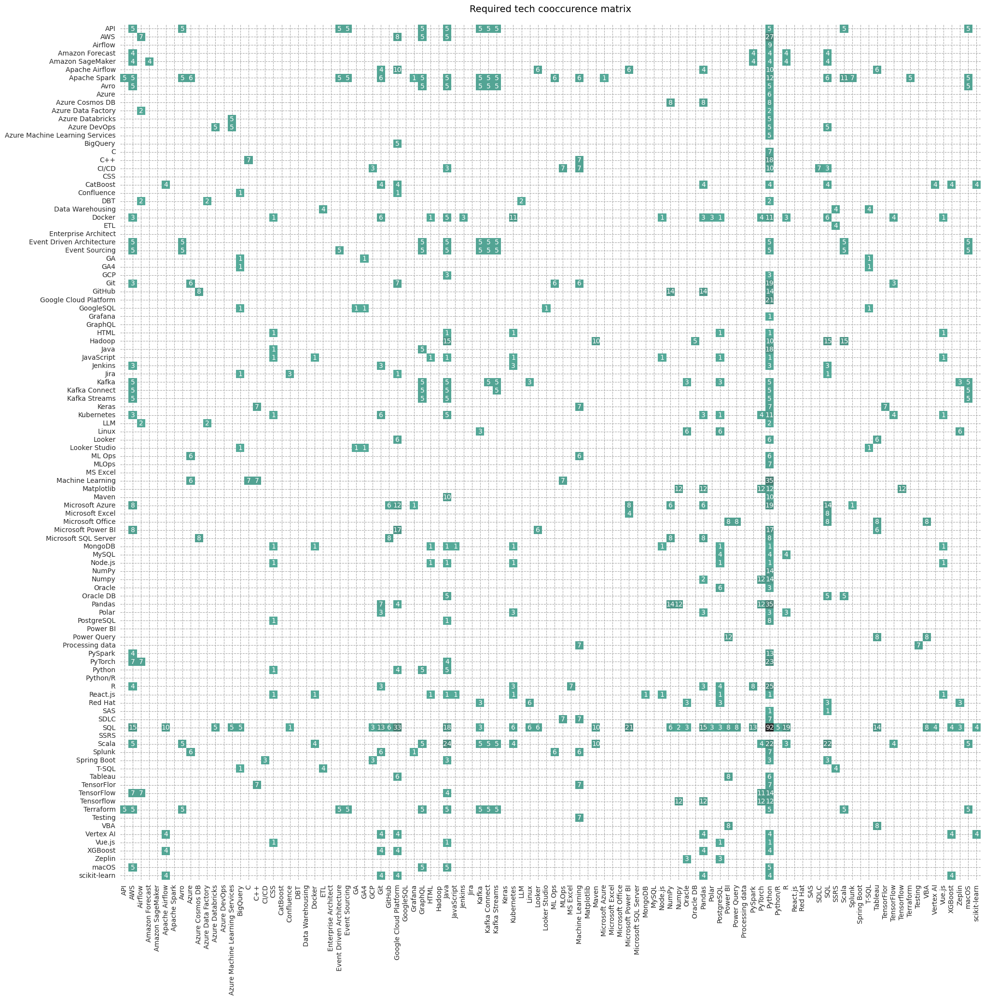

In [ ]:
# Set style
sns.set_style("whitegrid", rc = custom)
title_font_dct = {'color':'black',
                  'weight': 'normal',
                  'size': 14}
# Let's mask zeros
mask_coocc_req = np.array(~(tech_req_coocc_matrix[tech_req_coocc_matrix == 0].astype(bool)))

# Plot the matrix
fig, axs = plt.subplots(figsize=(23, 23))
sns.heatmap(tech_req_coocc_matrix, cmap=dark_green, annot=True, ax=axs, mask=mask_coocc_req, xticklabels=True, yticklabels=True, cbar=False)
plt.title('Required tech cooccurence matrix', fontdict=title_font_dct, y=1.01)
plt.show()

---

Above matrix needs some modification. The method, step=by-step is shown below.

---

In [ ]:
np.arange(16).reshape(4,4)

array([[ 0,  1,  2,  3],
       [ 4,  5,  6,  7],
       [ 8,  9, 10, 11],
       [12, 13, 14, 15]])

In [ ]:
np.arange(16).reshape(4,4) + np.arange(16).reshape(4,4).T

array([[ 0,  5, 10, 15],
       [ 5, 10, 15, 20],
       [10, 15, 20, 25],
       [15, 20, 25, 30]])

In [ ]:
np.tril(np.arange(16).reshape(4,4) + np.arange(16).reshape(4,4).T)

array([[ 0,  0,  0,  0],
       [ 5, 10,  0,  0],
       [10, 15, 20,  0],
       [15, 20, 25, 30]])

In [ ]:
new_tech_req_coocc_matrix = np.tril(tech_req_coocc_matrix.to_numpy() + tech_req_coocc_matrix.to_numpy().T)

In [ ]:
recuirements_coocmat_df = pd.DataFrame(new_tech_req_coocc_matrix, columns=tech_req_coocc_matrix.columns, index=tech_req_coocc_matrix.index)

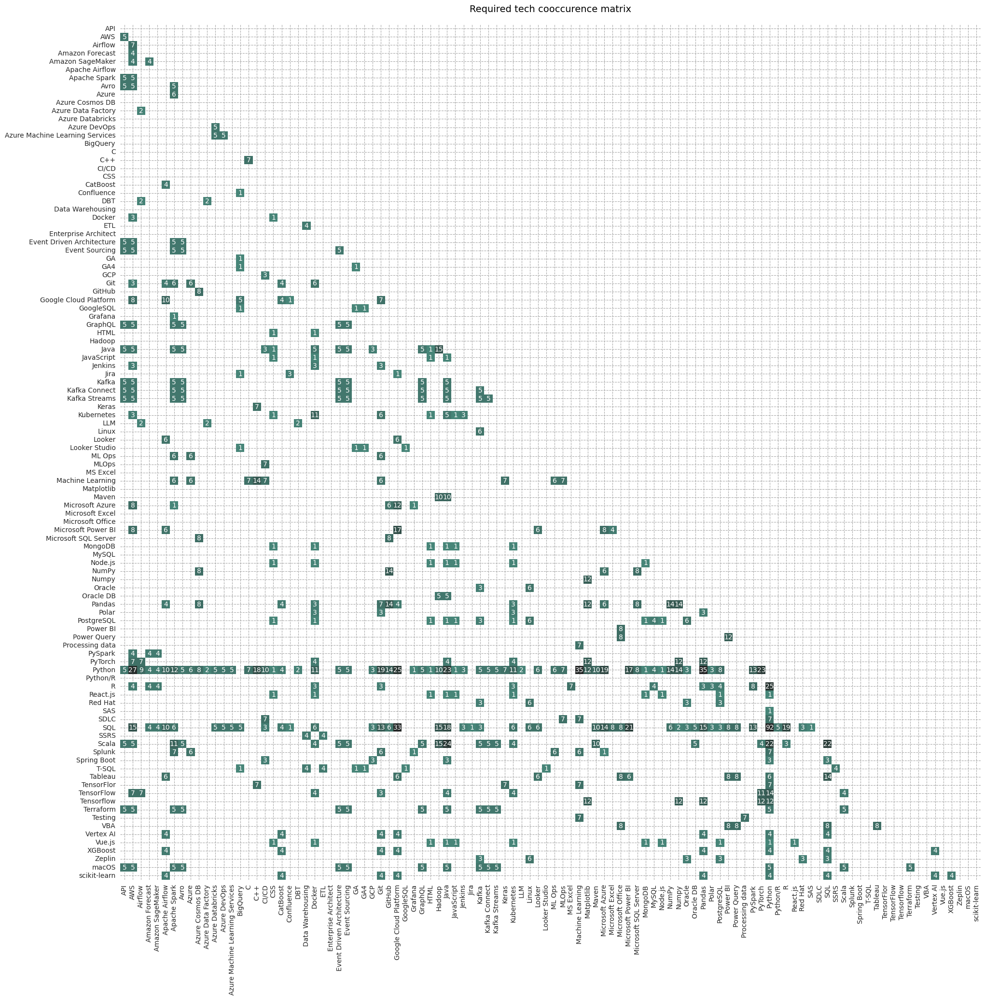

In [ ]:
sns.set_style("whitegrid", rc = custom)
# Let's mask zeros
mask_coocc_req_2 = np.array(~(recuirements_coocmat_df[recuirements_coocmat_df == 0].astype(bool)))

fig, axs = plt.subplots(figsize=(23, 23))

sns.heatmap(recuirements_coocmat_df, cmap=dark_green, annot=True, ax=axs, mask=mask_coocc_req_2, vmin=-10, vmax=29, xticklabels=True, yticklabels=True, cbar=False)
plt.title('Required tech cooccurence matrix', fontdict=title_font_dct, y=1.01)
plt.show()

In [ ]:
# Check if the transformation was correct
tech_req_coocc_matrix.loc[:, 'Apache Spark'].sum() + tech_req_coocc_matrix.loc['Apache Spark', :].sum() == recuirements_coocmat_df.loc[:, 'Apache Spark'].sum() + recuirements_coocmat_df.loc['Apache Spark', :].sum()

True

#### 5.2.3. Count the number of required tech occurences

In [ ]:
# Create a series that shows, how many times give tech occurs
required_tech_occ_S = pd.Series(tech_occurence_dict).sort_index()

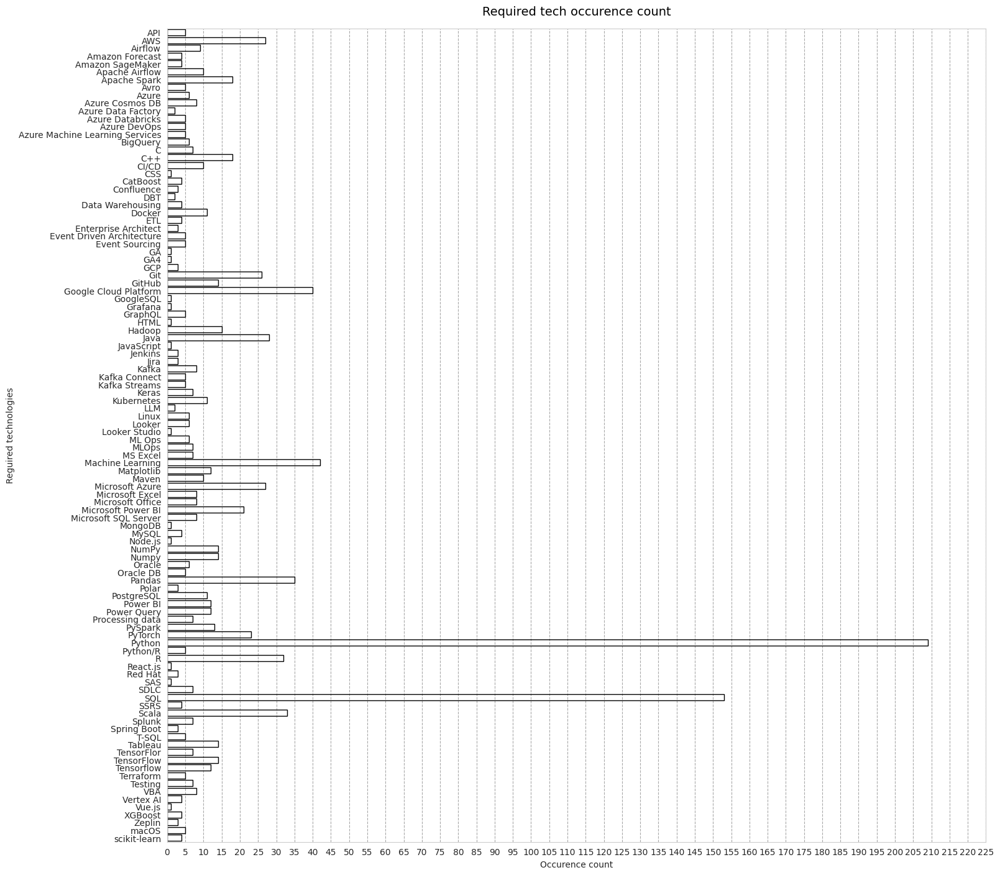

In [ ]:
sns.set_style("whitegrid", rc = custom)

fig, axs = plt.subplots(figsize=(17, 17))
sns.barplot(x = required_tech_occ_S, y = required_tech_occ_S.index, ax=axs, facecolor='none', edgecolor='black')
plt.title('Required tech occurence count', fontdict=title_font_dct, y=1.01)
plt.xticks(np.arange(0, 230, 5))
plt.xlabel('Occurence count')
plt.ylabel('Reguired technologies')
plt.show()

In [ ]:
# Count the number that given tech coocuts with any other tech
required_tech_cooc_dct = {}
for name in tech_req_coocc_matrix.columns:
  required_tech_cooc_dct[name] = tech_req_coocc_matrix.loc[:, name].sum() + tech_req_coocc_matrix.loc[name, :].sum()

#### 5.2.4. Count the number of required tech cooccurences

In [ ]:
required_tech_cooc_S = pd.Series(required_tech_cooc_dct)

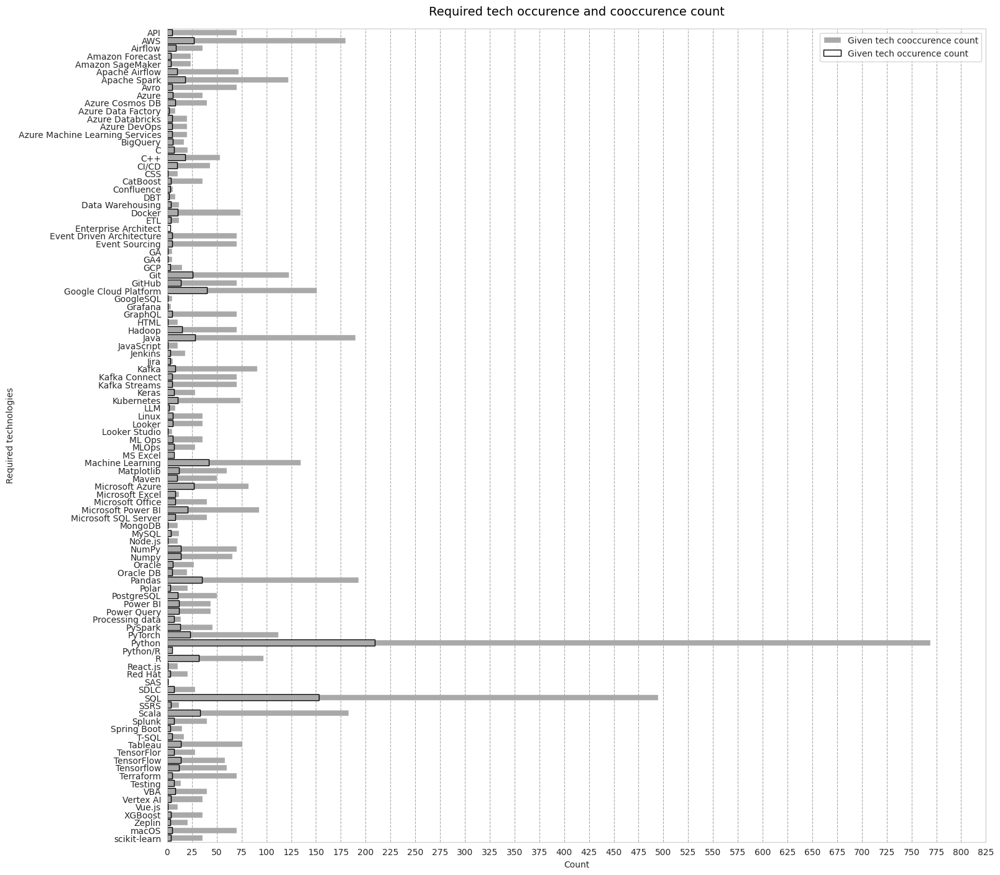

In [ ]:
sns.set_style("whitegrid", rc = custom)

fig, axs = plt.subplots(figsize=(17, 17))
sns.barplot(x = required_tech_cooc_S, y = required_tech_cooc_S.index, ax=axs,facecolor='darkgrey', zorder=0, label='Given tech cooccurence count')
sns.barplot(x = required_tech_occ_S, y = required_tech_occ_S.index, ax=axs, facecolor='none', edgecolor='black', linewidth=1, zorder=1, label='Given tech occurence count')
plt.title('Required tech occurence and cooccurence count', fontdict=title_font_dct, y=1.01)
plt.xticks(np.arange(0, 850, 25))
plt.xlabel('Count')
plt.ylabel('Required technologies')
plt.show()

#### 5.2.5. Create coocurrence network

The coocurence matrix and bar charts above are good, but not the best way to show tech cooccurence in job offers. Shell layout graph literally puts realtions between technologies mentioned in job offers at the center of inquiry.

In [ ]:
import networkx as nx

In [ ]:
# Initialize a NetworkX graph
G = nx.Graph()

# Add edges to the graph
for pair, count in number_of_cooocs.items():
  if len(pair)>1:
    tech1, tech2 = pair
    G.add_edge(tech1, tech2, weight=count)

# Set node sizes based on co-occurrence counts
node_sizes = np.array([required_tech_cooc_dct[tech] for tech in  G.nodes()])

In [ ]:
edge_widths = np.array([count for _, _, count in G.edges(data='weight')])

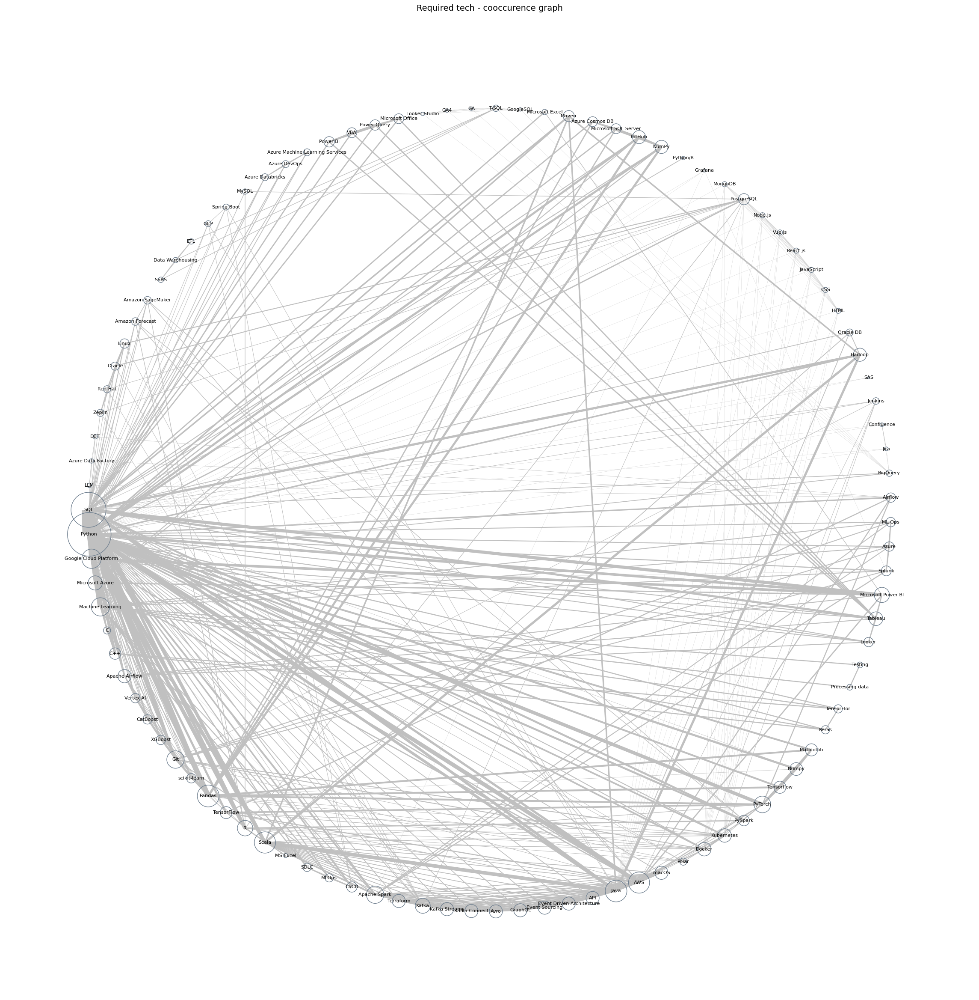

In [ ]:
# Plot the graph showing coocurence power
sns.set_style("whitegrid", rc = custom)

fig, ax = plt.subplots(figsize=(23, 23))
pos = nx.shell_layout(G)  # Define the layout of the nodes
nx.draw(G, pos, with_labels=True, node_size=node_sizes*7, width=edge_widths/4, node_color='none', edge_color='silver', edgecolors='slategrey', font_size=8)
edge_labels = nx.get_edge_attributes(G, 'weight')
ax.set_aspect('equal')
plt.tight_layout()
plt.title('Required tech - cooccurence graph', y=1.01, fontdict=title_font_dct)
plt.show()

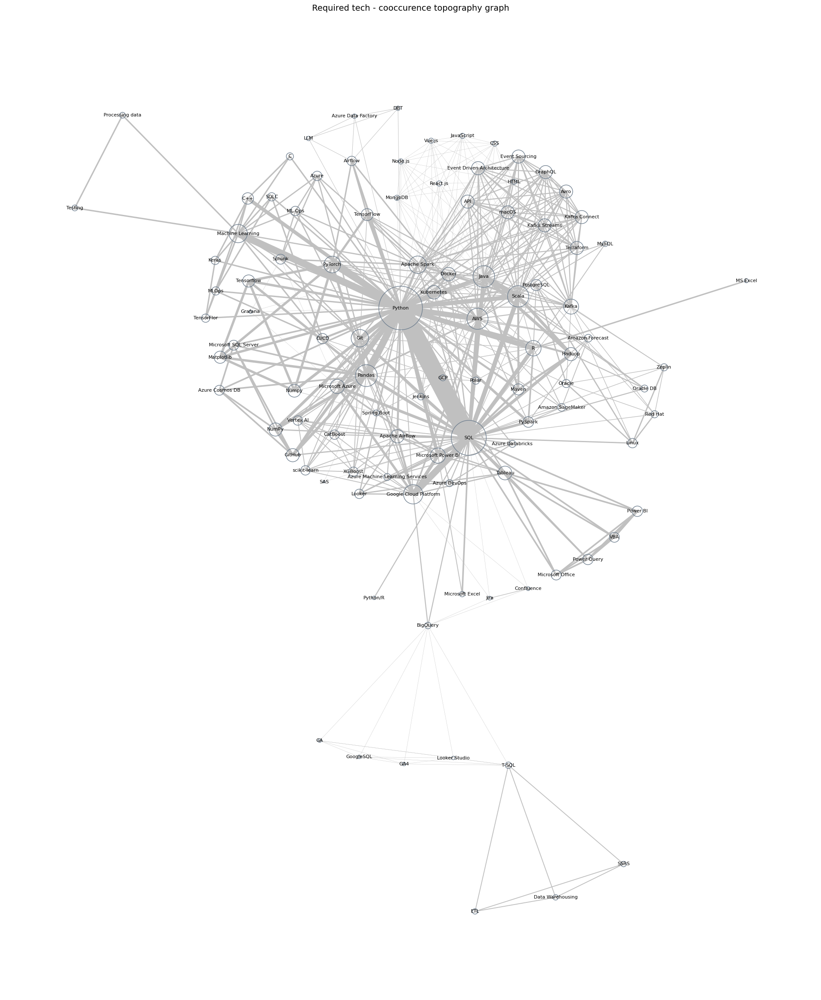

In [ ]:
# Plot the graph showing coocurence power
sns.set_style("whitegrid", rc = custom)

fig, ax = plt.subplots(figsize=(23, 23))
pos = nx.kamada_kawai_layout(G, weight=.001, scale=.0001)  # Define the layout of the nodes
nx.draw(G, pos, with_labels=True, node_size=node_sizes*7, width=edge_widths/3, node_color='none', edge_color='silver', edgecolors='slategrey', font_size=8)
edge_labels = nx.get_edge_attributes(G, 'weight')
ax.set_aspect('equal')
plt.tight_layout()
plt.title('Required tech - cooccurence topography graph', y=1.01, fontdict=title_font_dct)
plt.show()

### 5.4. Analyze optional technologies (co-)occurence

#### 5.4.1. Create cooccurence matrix

In [ ]:
# Create index for co-occurence matrix
tech_list_opt = []
for value in working_df['section-technologies-optional']:
  tech_list_opt.extend(value)

tech_index_opt = sorted(list(set(tech_list_opt)))

In [ ]:
# Count number of times given tech occurs
tech_optional_occurence_dict = Counter(tech_list_opt)

In [ ]:
list_of_coocc_tuples = []
# Count the number of occurences
for row in working_df['section-technologies-optional']:
  for a_tuple in itertools.combinations(row, 2):
    # Secure that all pair-combinations are saved one-way
    a_tuple = tuple(set(a_tuple))
    list_of_coocc_tuples.append(a_tuple)


In [ ]:
# Count the number of cooscurences
number_of_cooocs_optional = Counter(list_of_coocc_tuples)

In [ ]:
# Create blank cooccurence matrix
tech_opt_coocc_matrix = pd.DataFrame(index=tech_index_opt, columns=tech_index_opt, data=np.zeros(shape=(len(tech_index_opt), len(tech_index_opt)), dtype=np.int_))

In [ ]:
for key, value in number_of_cooocs_optional.items():
  tech_opt_coocc_matrix.loc[key[0], key[1]] += int(value)

In [ ]:
tech_opt_coocc_matrix.loc['Python', :].sum() + tech_req_coocc_matrix.loc[:, 'Python'].sum()

754

In [ ]:
new_tech_opt_coocc_matrix = np.tril(tech_opt_coocc_matrix.to_numpy() + tech_opt_coocc_matrix.to_numpy().T)

In [ ]:
requirements_optional_coocmat_df = pd.DataFrame(new_tech_opt_coocc_matrix, columns=tech_opt_coocc_matrix.columns, index=tech_opt_coocc_matrix.index)

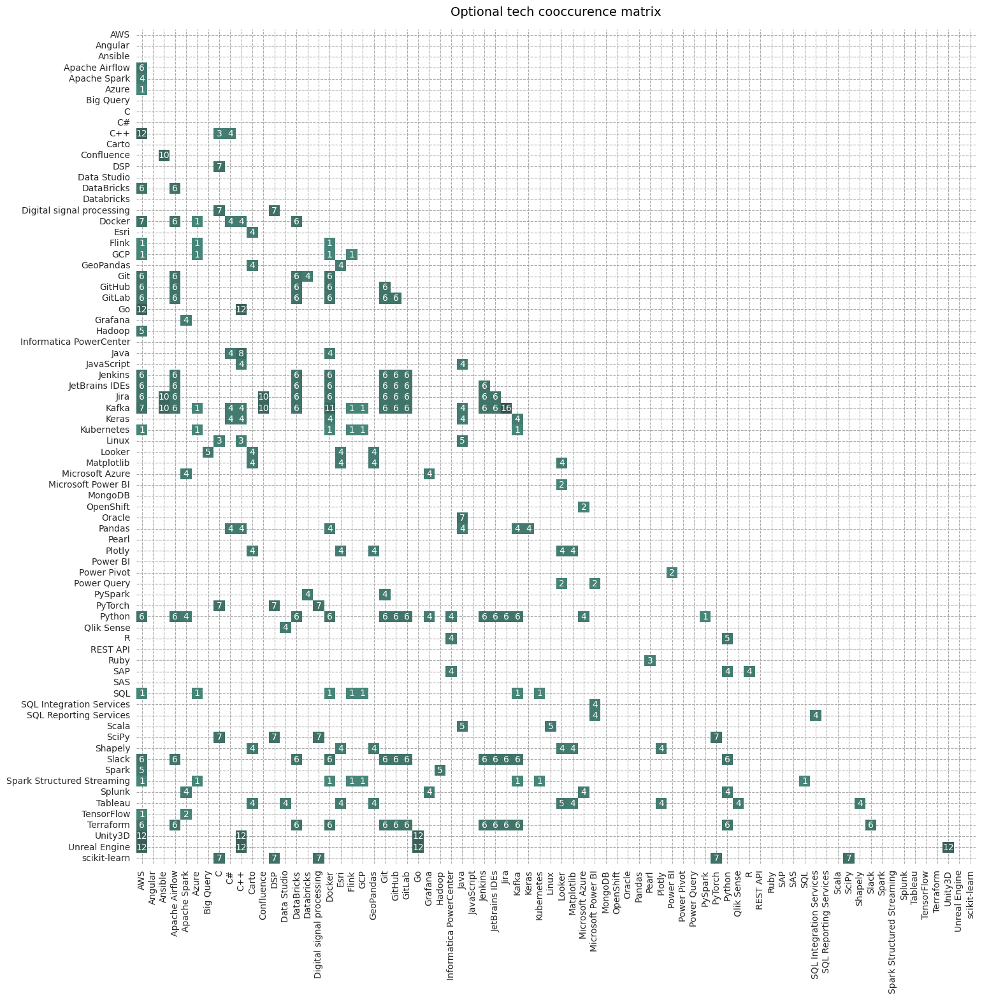

In [ ]:
sns.set_style("whitegrid", rc = custom)
# Let's mask zeros
mask_coocc_req_2 = np.array(~(requirements_optional_coocmat_df[requirements_optional_coocmat_df == 0].astype(bool)))

fig, axs = plt.subplots(figsize=(17, 17))

sns.heatmap(requirements_optional_coocmat_df, cmap=dark_green, annot=True, ax=axs, mask=mask_coocc_req_2, vmin=-10, vmax=29, xticklabels=True, yticklabels=True, cbar=False)
plt.title('Optional tech cooccurence matrix', fontdict=title_font_dct, y=1.01)
plt.show()

#### 5.4.2. Count the number of optional tech occurences.

In [ ]:
# Create a series that shows, how many times give tech occurs
optional_tech_occ_S = pd.Series(tech_optional_occurence_dict).sort_index()

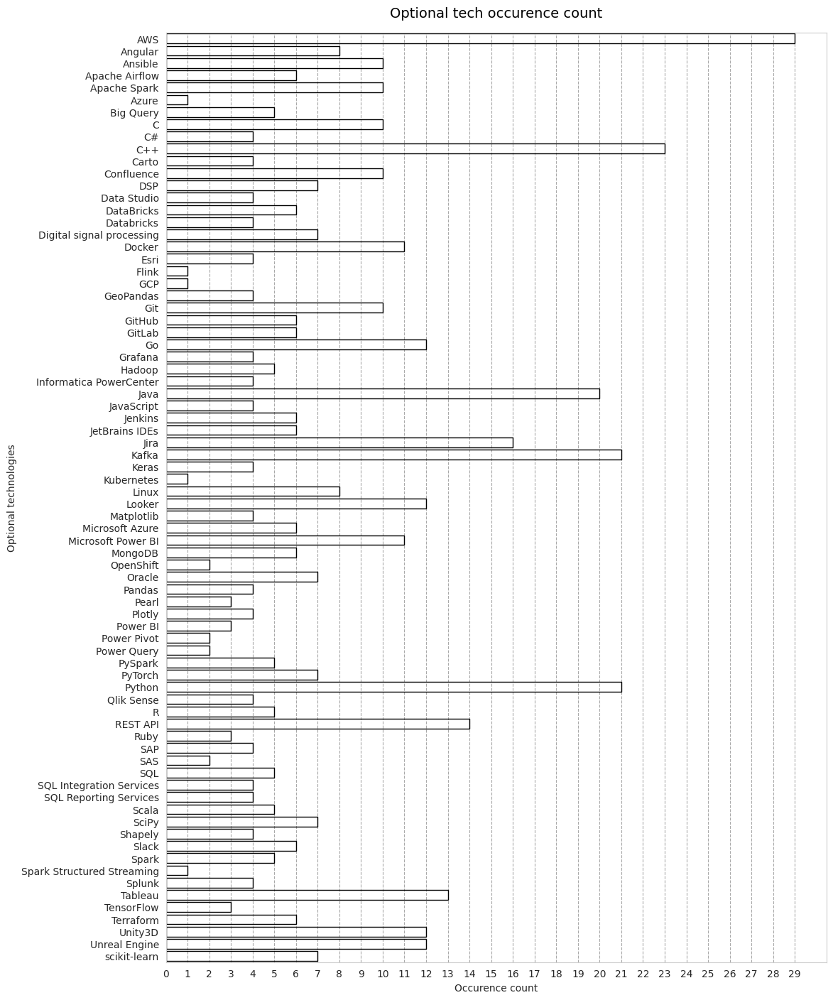

In [ ]:
sns.set_style("whitegrid", rc = custom)

fig, axs = plt.subplots(figsize=(12, 17))
sns.barplot(x = optional_tech_occ_S, y = optional_tech_occ_S.index, ax=axs, facecolor='none', edgecolor='black')
plt.title('Optional tech occurence count', fontdict=title_font_dct, y=1.01)
plt.xticks(np.arange(0, 30, 1))
plt.xlabel('Occurence count')
plt.ylabel('Optional technologies')
plt.show()

#### 5.4.3. Count the number of optional tech cooccurences.

In [ ]:
# Count the number that given tech coocuts with any other tech
optional_tech_cooc_dct = {}
for name in tech_opt_coocc_matrix.columns:
  optional_tech_cooc_dct[name] = tech_opt_coocc_matrix.loc[:, name].sum() + tech_opt_coocc_matrix.loc[name, :].sum()



In [ ]:
optional_tech_cooc_S = pd.Series(optional_tech_cooc_dct)

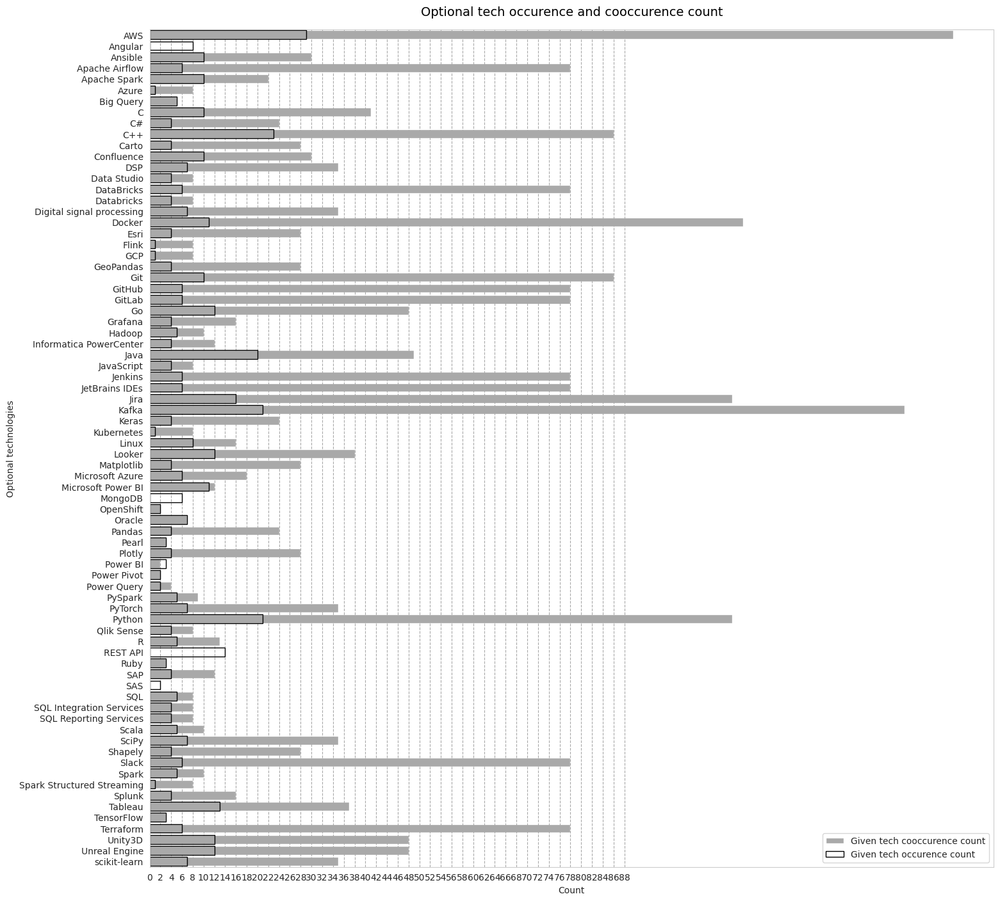

In [ ]:
sns.set_style("whitegrid", rc = custom)

fig, axs = plt.subplots(figsize=(17, 17))
sns.barplot(x = optional_tech_cooc_S, y = optional_tech_cooc_S.index, ax=axs,facecolor='darkgrey', zorder=0, label='Given tech cooccurence count')
sns.barplot(x = optional_tech_occ_S, y = optional_tech_occ_S.index, ax=axs, facecolor='none', edgecolor='black', linewidth=1, zorder=1, label='Given tech occurence count')
plt.title('Optional tech occurence and cooccurence count', fontdict=title_font_dct, y=1.01)
plt.xticks(np.arange(0, 90, 2))
plt.xlabel('Count')
plt.ylabel('Optional technologies')
plt.show()

#### 5.4.4. Create cooccurence graph

In [ ]:
# Initialize a NetworkX graph
G = nx.Graph()

# Add edges to the graph
for pair, count in number_of_cooocs_optional.items():
    tech1, tech2 = pair
    G.add_edge(tech1, tech2, weight=count)

# Set node sizes based on co-occurrence counts
node_sizes = np.array([optional_tech_cooc_dct[tech] for tech in  G.nodes()])

In [ ]:
edge_widths = np.array([count for _, _, count in G.edges(data='weight')])

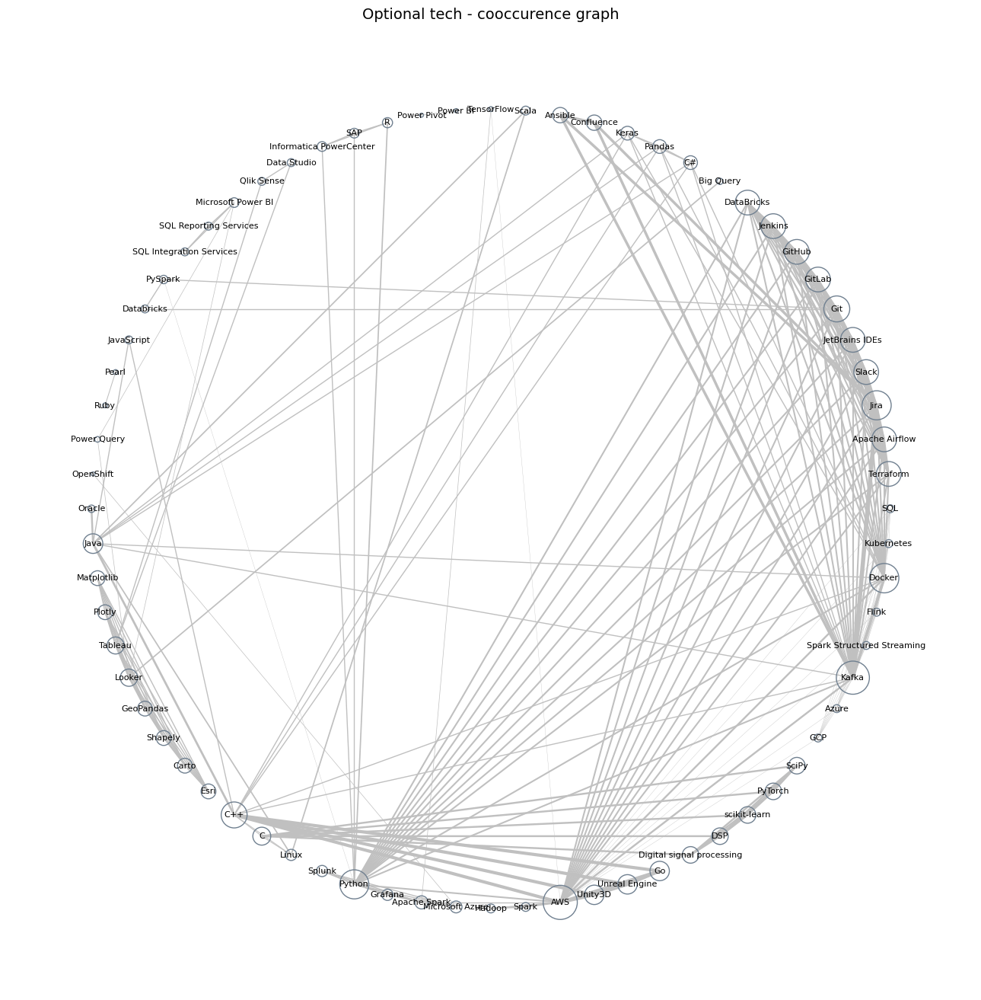

In [ ]:
# Plot the graph showing coocurence power
sns.set_style("whitegrid", rc = custom)

fig, ax = plt.subplots(figsize=(13, 13))
pos = nx.shell_layout(G)  # Define the layout of the nodes
nx.draw(G, pos, with_labels=True, node_size=node_sizes*7, width=edge_widths/4, node_color='none', edge_color='silver', edgecolors='slategrey', font_size=8)
edge_labels = nx.get_edge_attributes(G, 'weight')
ax.set_aspect('equal')
plt.tight_layout()
plt.title('Optional tech - cooccurence graph', fontdict=title_font_dct)
plt.show()

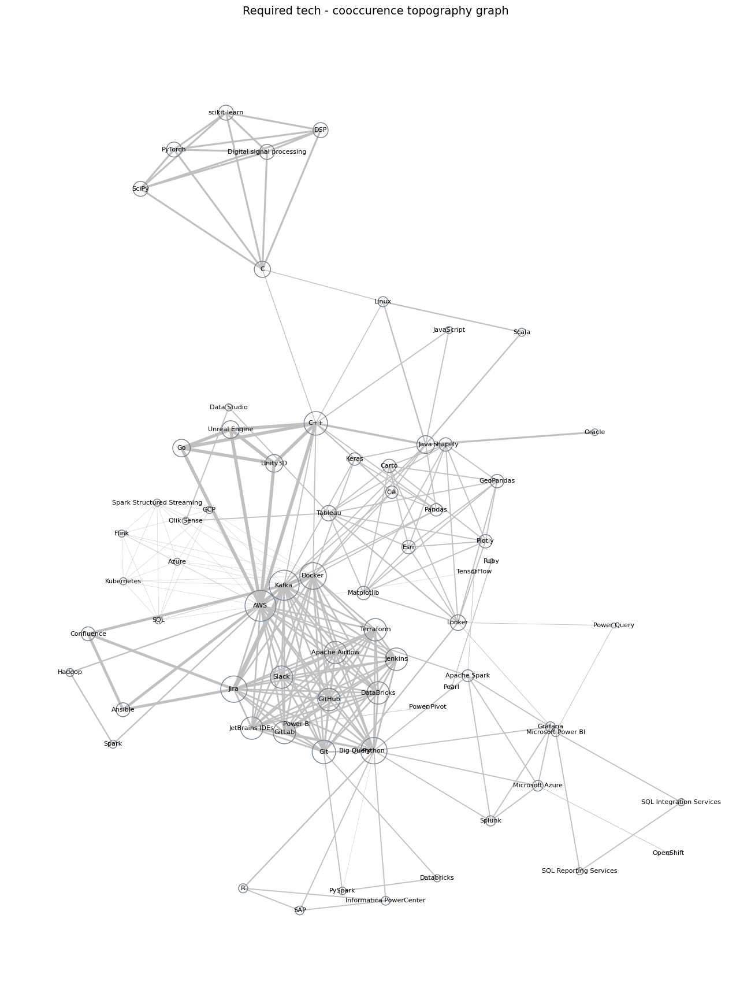

In [ ]:
# Plot the graph showing coocurence power
sns.set_style("whitegrid", rc = custom)

fig, ax = plt.subplots(figsize=(17, 17))
pos = nx.kamada_kawai_layout(G, weight=.001)  # Define the layout of the nodes
nx.draw(G, pos, with_labels=True, node_size=node_sizes*10, width=edge_widths/3, node_color='none', edge_color='silver', edgecolors='slategrey', font_size=8)
edge_labels = nx.get_edge_attributes(G, 'weight')
ax.set_aspect('equal')
plt.tight_layout()
plt.title('Required tech - cooccurence topography graph', y=1.01, fontdict=title_font_dct)
plt.show()

### 5.5. Analyze optional vs required tech coocurence

In [ ]:
working_df.head(3)

,section-contract,section-workplace,section-technologies,section-responsibilities,section-requirements,title,link,section-technologies-required,section-technologies-optional
0,salary not specified\n \nB2B contract (full-time),"Kraków, Grzegórzki\nFabryczna 1",Technologies we use\nExpected\nPython\nSQL,Your responsibilities\n- Apply data science te...,Our requirements\nMaster's degree in a quantit...,"Praca Data Scientist , Star Beta Poland sp. z ...",https://theprotocol.it/szczegoly/praca/data-sc...,"[Python, SQL]",[]
1,salary not specified\n \ncontract of employmen...,"Kraków, Grzegórzki\nLubicz 23a",Technologies we use\nExpected\nPython\nGoogle ...,Your responsibilities\nThe main responsibility...,Our requirements\nDeep practical knowledge of ...,"Praca Data Scientist AI Governance, ALTEN Pols...",https://theprotocol.it/szczegoly/praca/data-sc...,"[Python, Google Cloud Platform, Microsoft Azure]",[]
2,16 000\n–\n25 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython / C++ development\nDa...,"Praca Machine Learning Engineer, Zone IT Sp. z...",https://theprotocol.it/szczegoly/praca/machine...,"[Python, Machine Learning, C, C++]","[Java, Oracle]"


In [ ]:
type(working_df['section-technologies-optional'].iloc[0])

list

In [ ]:
req_vs_optional_df = working_df[working_df['section-technologies-optional'].apply(lambda x: len(x) != 0)]

In [ ]:
req_vs_optional_df.head(3)

,section-contract,section-workplace,section-technologies,section-responsibilities,section-requirements,title,link,section-technologies-required,section-technologies-optional
2,16 000\n–\n25 000\n \nzł\ngross\n \n/\n \nmth....,"Wrocław, Fabryczna\nWagonowa 2d",Technologies we use\nExpected\nPython\nMachine...,Your responsibilities\nContribute to the desig...,Our requirements\nPython / C++ development\nDa...,"Praca Machine Learning Engineer, Zone IT Sp. z...",https://theprotocol.it/szczegoly/praca/machine...,"[Python, Machine Learning, C, C++]","[Java, Oracle]"
3,salary not specified\n \ncontract of employmen...,"Poznań, Wilda\nWierzbięcice 1B\nmultiple locat...",Technologies we use\nExpected\nSQL\nGoogle Clo...,Your responsibilities\nData Management: Collab...,Our requirements\nEducation: Graduated with a ...,"Praca Data Scientist, Allegro, Poznań, Wierzbi...",https://theprotocol.it/szczegoly/praca/data-sc...,"[SQL, Google Cloud Platform, Apache Airflow, V...","[Matplotlib, Plotly, Tableau, Looker, GeoPanda..."
4,salary not specified\n \ncontract of mandate,"Warszawa, Wola\nplac Europejski 1",Technologies we use\nExpected\nPython\nGit\nTe...,Your responsibilities\nDesign and implementati...,Our requirements\nGood knowledge of all our co...,Praca Internship – Machine Learning for Audio ...,https://theprotocol.it/szczegoly/praca/interns...,"[Python, Git, TensorFlow]","[C, C++, Linux]"


In [ ]:
req_vs_opt_list_of_coocc_tuples = []
# Count the number of occurences
for opt, req in zip(req_vs_optional_df['section-technologies-optional'], req_vs_optional_df['section-technologies-required']):
  combinations = [(x, y) for x in opt for y in req]
  # We do not order the tuples with set() - we want to save information about what is optional and what is required
  req_vs_opt_list_of_coocc_tuples += combinations

In [ ]:
# Count the number of cooscurences
req_vs_opt_number_of_cooocs = Counter(req_vs_opt_list_of_coocc_tuples)

#### 5.5.1. Create cooccurence matrix

In [ ]:
# Create blank cooccurence matrix
req_vs_opt_coocc_matrix = pd.DataFrame(index=tech_index_opt, columns=tech_index_req, data=np.zeros(shape=(len(tech_index_opt), len(tech_index_req)), dtype=np.int_))

In [ ]:
for key, value in req_vs_opt_number_of_cooocs.items():
  req_vs_opt_coocc_matrix.loc[key[0], key[1]] += int(value)

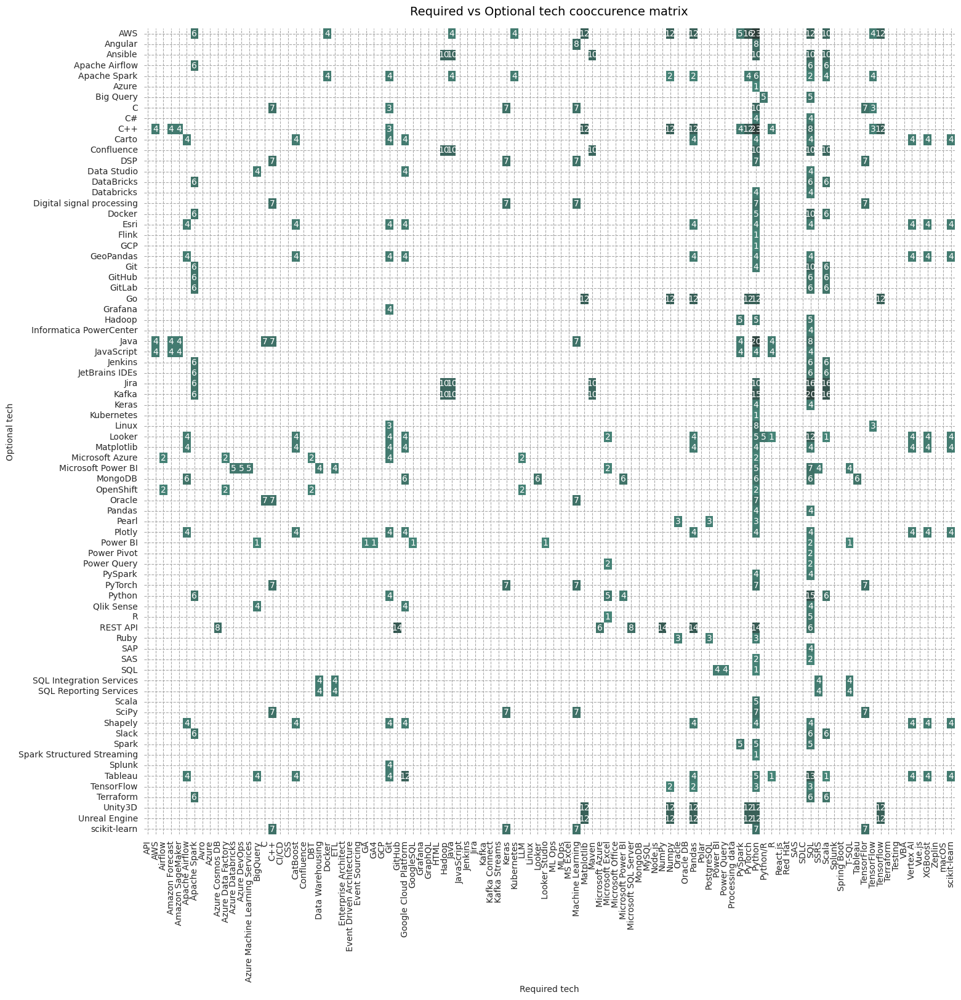

In [ ]:
sns.set_style("whitegrid", rc = custom)
# Let's mask zeros
mask_coocc_req_vs_opt = np.array(~(req_vs_opt_coocc_matrix[req_vs_opt_coocc_matrix == 0].astype(bool)))

fig, axs = plt.subplots(figsize=(17, 17))

sns.heatmap(req_vs_opt_coocc_matrix, cmap=dark_green, annot=True, ax=axs, mask=mask_coocc_req_vs_opt, vmin=-10, vmax=29, xticklabels=True, yticklabels=True, cbar=False)
axs.set_xlabel('Required tech')
axs.set_ylabel('Optional tech')
plt.title('Required vs Optional tech cooccurence matrix', fontdict=title_font_dct, y=1.01)
plt.show()

#### 5.5.2. Create cooccurence graph

In [ ]:
G.nodes

NodeView(('Oracle', 'Java', 'Matplotlib', 'Plotly', 'Tableau', 'Looker', 'GeoPandas', 'Shapely', 'Carto', 'Esri', 'C++', 'C', 'Linux', 'Splunk', 'Python', 'Grafana', 'Apache Spark', 'Microsoft Azure', 'Hadoop', 'Spark', 'AWS', 'Unity3D', 'Unreal Engine', 'Go', 'Digital signal processing', 'DSP', 'scikit-learn', 'PyTorch', 'SciPy', 'GCP', 'Azure', 'Kafka', 'Spark Structured Streaming', 'Flink', 'Docker', 'Kubernetes', 'SQL', 'Terraform', 'Apache Airflow', 'Jira', 'Slack', 'JetBrains IDEs', 'Git', 'GitLab', 'GitHub', 'Jenkins', 'DataBricks', 'Big Query', 'C#', 'Pandas', 'Keras', 'Confluence', 'Ansible', 'Scala', 'TensorFlow', 'Power BI', 'Power Pivot', 'R', 'SAP', 'Informatica PowerCenter', 'Data Studio', 'Qlik Sense', 'Microsoft Power BI', 'SQL Reporting Services', 'SQL Integration Services', 'PySpark', 'Databricks', 'JavaScript', 'Pearl', 'Ruby', 'Power Query', 'OpenShift'))

<ipython-input-175-7b1321a269e1>:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


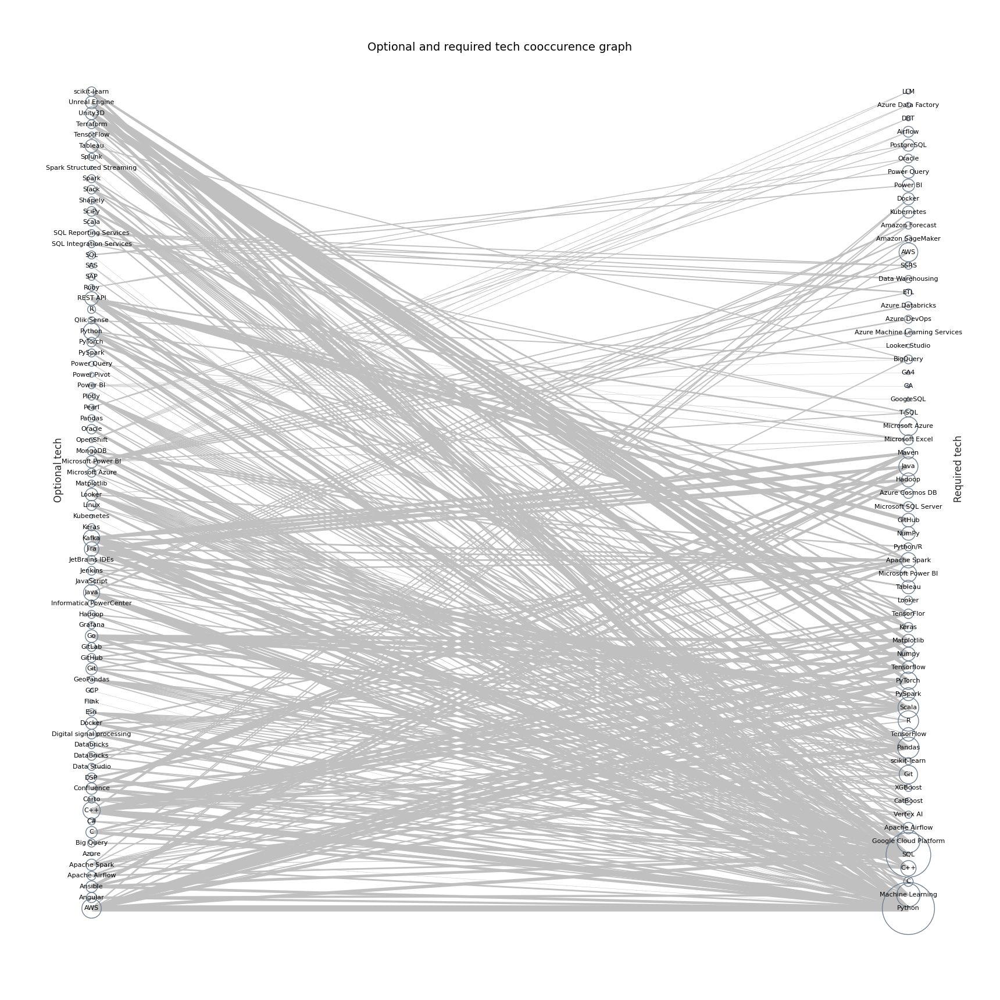

In [ ]:
# Create a directed graph
G = nx.Graph()

for (tech_opt, tech_req), count in req_vs_opt_number_of_cooocs.items():
  # Get the tech occurence for node sizes
  tech_opt_count = optional_tech_occ_S.loc[tech_opt]
  tech_req_count = required_tech_occ_S.loc[tech_req]

  # Make node names unique between optional and required
  tech_opt += '_opt'
  tech_req += '_req'
  G.add_edge(tech_opt, tech_req, weight=count)

  # Set node attributes
  nx.set_node_attributes(G, {tech_opt:tech_opt_count}, 'weight')
  nx.set_node_attributes(G, {tech_req:tech_req_count}, 'weight')


optional_for_graph = [x + '_opt' for x in tech_index_opt]
required_for_graph = [x + '_req' for x in tech_index_req]

# Setup bipartite layout
pos = nx.bipartite_layout(G, optional_for_graph)

# Get edge weights
edge_weights = nx.get_edge_attributes(G, 'weight')

# Get node weights
node_weights = nx.get_node_attributes(G, 'weight')

# Create a mapping between original node names and stripped labels
label_mapping = {node: node.replace('_opt', '').replace('_req', '') for node in G.nodes}

# Draw the graph
plt.figure(figsize=(17, 17))
nx.draw(G, pos, with_labels=True, labels=label_mapping, node_size=[node_weights[node]*20 for node in G.nodes], width=[edge_weights[edge]/3 for edge in G.edges], node_color='none', edge_color='silver', edgecolors='slategrey', font_size=8)

plt.title('Optional and required tech cooccurence graph', fontdict=title_font_dct, y=0.95)
plt.text(s='Optional tech', x=-0.9, y=0.0, rotation=90, fontdict={'size': 12})
plt.text(s='Required tech', x=1.1, y=0.0, rotation=90, fontdict={'size': 12})
plt.tight_layout()
plt.show()

On the left side we have optional tech, on the right: required tech. The problem is graph is rather grubby. We need to make it more readable. We will use Plotly to obtain interactive version of this graph.

In [ ]:
import plotly.graph_objects as go

In [ ]:
!pip install mpld3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.6/202.6 kB 4.4 MB/s eta 0:00:00


In [ ]:
from bokeh.io import show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, MultiLine, Circle, Range1d
from bokeh.plotting import figure
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, MultiLine, Circle
from bokeh.models.renderers import GraphRenderer
from bokeh.models.graphs import StaticLayoutProvider

In [ ]:
import networkx as nx
from bokeh.io import output_notebook, show
from bokeh.models import Plot, Range1d, Circle, HoverTool
from bokeh.plotting import from_networkx
from bokeh.models.graphs import StaticLayoutProvider

# Create a directed graph
G = nx.Graph()

for (tech_opt, tech_req), count in req_vs_opt_number_of_cooocs.items():
    # Get the tech occurrence for node sizes
    tech_opt_count = optional_tech_occ_S.loc[tech_opt]
    tech_req_count = required_tech_occ_S.loc[tech_req]

    # Make node names unique between optional and required
    tech_opt += '_opt'
    tech_req += '_req'
    G.add_edge(tech_opt, tech_req, weight=count)

    # Set node attributes
    nx.set_node_attributes(G, {tech_opt: tech_opt_count}, 'weight')
    nx.set_node_attributes(G, {tech_req: tech_req_count}, 'weight')

# Get edge weights
edge_weights = nx.get_edge_attributes(G, 'weight')

# Get node weights
node_weights = nx.get_node_attributes(G, 'weight')

# Create a Bokeh plot
plot = Plot(width=800, height=600, x_range=Range1d(-1.1, 1.1), y_range=Range1d(-1.1, 1.1))
plot.title.text = "Graph"

# Create a GraphRenderer
graph_renderer = GraphRenderer()

# Set node positions and colors
graph_renderer.node_renderer.data_source.data = {
    'index': list(G.nodes()),
    'color': ['blue' if 'opt' in node else 'red' for node in G.nodes()]
}

# Set edge positions
graph_renderer.edge_renderer.data_source.data = {
    'start': [edge[0] for edge in G.edges()],
    'end': [edge[1] for edge in G.edges()]
}

# Convert node positions to integer keys
pos_int_keys = {}
for idx, (key, value) in enumerate(pos.items()):
    pos_int_keys[idx] = value

# Define layout provider
layout_provider = StaticLayoutProvider(graph_layout=pos_int_keys)
graph_renderer.layout_provider = layout_provider

# Add node glyphs
graph_renderer.node_renderer.glyph = Circle(size='node_size', fill_color='color')

# Create hover tool
hover = HoverTool(tooltips=[("index", "@index")])

# Add graph renderer to the plot
plot.renderers.append(graph_renderer)

# Add tools to the plot
plot.add_tools(hover)

# Show the plot
output_notebook()
show(plot)


ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : size='node_size' [no close matches] {renderer: GlyphRenderer(id='p1015', ...)}


===
BOKEH implementation: for later
===

## 6. Job title again - key phrase extraction

In [ ]:
random_indices_list = np.random.randint(0, len(working_df), size=23)
working_df.title[random_indices_list]

261    Data Science Engineer job, Connectis_, Warsaw ...
15     Praca Data Scientist, WINGED IT SP Z O O, Wars...
269    Data Scientist job, Digital Care Sp. z o. o., ...
82     Praca Machine Learning Engineer, Zone IT Sp. z...
273    Job Data Analyst, OEX Cursor S.A. , Warszawa, ...
261    Data Science Engineer job, Connectis_, Warsaw ...
340    Data Science Engineer job, Connectis_, Warsaw ...
319    Data Analyst job, Polkomtel Sp. z o. o., Warsz...
221    Job Data Scientist/ Machine Learning Specialis...
89     Praca Machine Learning Engineering Leader, Sam...
25     Praca Senior Data Engineer - Machine Learning ...
237    Job: Data Analyst, Imar Service Group sp. z o....
188    Data Analyst job – Data Analyst, Steripack Med...
74     Praca Middle Big Data Engineer, KITRUM, Warsza...
14     Praca Junior Machine Learning Engineer, The St...
17     Praca Senior Machine Learning Engineer, Samsun...
275    Data Science Engineer job, Connectis_, Warsaw ...
222    Job Data Analyst / Devel

In [ ]:
working_df.title[65].split(',')

['Praca Data Scientist',
 ' Zone IT Sp. z o.o.',
 ' Wrocław',
 ' Wagonowa 2d - theprotocol.it']

In [ ]:
# Define the function to clean job titles
def clean_job_titles(text):
  parts = text.split(',')
  title_words = parts[0].split()
  title_words = [word for word in title_words if word.lower() not in ['job', 'praca']]
  cleaned_title = ' '.join(title_words)

  return cleaned_title

In [ ]:
working_df['position_name'] = working_df['title'].apply(clean_job_titles)

In [ ]:
working_df['position_name'].value_counts()

Data Scientist                                                          86
Data Analyst                                                            22
Machine Learning Engineer                                               14
Senior Data Scientist                                                   12
Senior Machine Learning Engineer                                        11
Machine Learning Engineering Leader                                      7
Machine Learning Developer                                               7
Machine Learning Engineer (Generative AI)                                7
Software Development Manager (Machine Learning Software Engineering)     7
Middle Big Data Engineer                                                 6
NLP Data Science specialist                                              6
Data Scientist (Decision Intelligence)                                   6
Senior Data Engineer - Machine Learning Research                         6
Senior Software Engineer 

Well, we were hoping for few categories that will help us perform further analysis (depending on position name as category), but apparently HR departments are rather creative in namming positions. We need to do some additional categorization. Looking at value counts above, we could probably come up with some rule-based method. Let's forget for a moment that our dataset has under 200 rows and try something more sophisticated: we will try clustering position names, and then - hopefully - we will name the clusters.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

In [ ]:
# Perform KMeans clustering

vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(working_df['position_name'].values)
kmeans = KMeans(n_clusters=6, random_state=SEED)
kmeans.fit(X)

cluster_labels = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


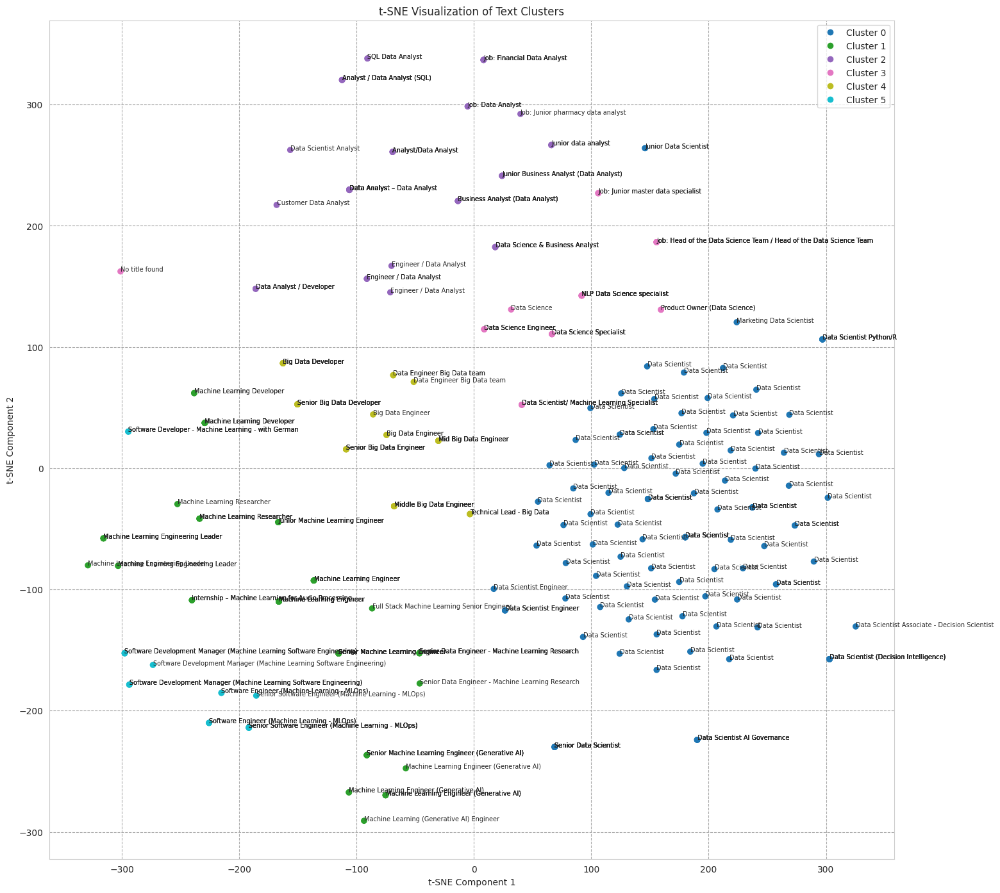

In [ ]:
# Reduce dimensionality using t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X.toarray())

# Plot the points colored by cluster labels
plt.figure(figsize=(17, 17))

scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=cluster_labels, cmap='tab10', label=cluster_labels)

# Add labels for each point
for i, txt in enumerate(working_df['position_name'].values):
    plt.annotate(txt, (X_tsne[i, 0], X_tsne[i, 1]), fontsize=7)

plt.title('t-SNE Visualization of Text Clusters')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(handles=scatter.legend_elements()[0], labels=[f'Cluster {digit}' for digit in np.unique(cluster_labels)])
plt.show()

Our KMens clustering turned out rather well. Let's append labels to our working_df.

In [ ]:
working_df['SixMeans_labales'] = cluster_labels

And name the clusters. We dissolve clusters 2, 4 and 5 into one category: Data Scientist.

In [ ]:
cluster_names_dct = {
    0: 'Data Scientist',
    1: 'Machine Learning Engineer',
    2: 'Data Analyst',
    3: 'Data Scientist',
    4: 'Big Data Engineer',
    5: 'Machine Learning Engineer',
}

In [ ]:
working_df['job_cats'] = working_df['SixMeans_labales'].replace(cluster_names_dct)

In [ ]:
working_df[['position_name', 'job_cats']]

,position_name,job_cats
0,Data Scientist,Data Scientist
1,Data Scientist AI Governance,Data Scientist
2,Machine Learning Engineer,Machine Learning Engineer
3,Data Scientist,Data Scientist
4,Internship – Machine Learning for Audio Proces...,Machine Learning Engineer
...,...,...
337,Job: Financial Data Analyst,Data Analyst
338,Business Analyst (Data Analyst),Data Analyst
339,Data Scientist,Data Scientist
340,Data Science Engineer,Data Scientist


## 7. Requirements - paragraph text mining and analysis

Analysing the `'section-requirements'` column we will

1. Use scattertext with categories created above to analyse how certain words in paragraph text fit to each category.
1. Check how traditional models offered by gensim API deal with topic modelling for section-requirements data.
2. We will adjust our method on the basis of (1.)

But before that let's create word embedding in GloVe

### 7.1. Prepare the text using spaCy

In [ ]:
!pip install scattertext

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 46.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for flashtext: filename=flashtext-2.7-py2.py3-none-any.whl size=9296 sha256=2d459156e1e281528a334343fa361861b85c2925b03c92f2f2af2c3434eb0295
  Stored in directory: /root/.cache/pip/wheels/bc/be/39/c37ad168eb2ff644c9685f52554440372129450f0b8ed203dd
Successfully built flashtext


In [ ]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string

In [ ]:
# Download NLTK resources (uncomment the following line if needed)
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# Define stopwords
stop_words = set(stopwords.words('english'))

In [ ]:
def preprocess_requirements(text):
  tokens = word_tokenize(text.lower())
  tokens = [word for word in tokens if (word.isalpha() and word not in stop_words )]
  return tokens

In [ ]:
import spacy
import scattertext

In [ ]:
!python -m spacy download en_core_web_md

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 MB 11.4 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
nl_processor = spacy.load("en_core_web_md")

In [ ]:
sample_doc = nl_processor(working_df['section-requirements'][1])

In [ ]:
type(sample_doc)

spacy.tokens.doc.Doc

In [ ]:
for token in sample_doc[:2]:
  print(token.text, token.vector)

Our [  3.1074     0.72394   -9.167     -0.30766   10.752     -2.798
  -0.72701   -4.1254    -1.3027    -4.82      -0.80693   -4.7278
  -5.6635    -7.4627    -6.9985    -3.4255     3.2894     3.7487
  -4.0257    -6.68      -1.0876    -5.3629     4.0496    -0.83661
   1.4365    -1.4027    -0.43098    1.8376    -6.6367    -3.7668
   7.8758    -7.4201    -5.5451     1.1962    -2.4869     1.3242
   7.4938    -4.9156     7.3657    -0.047913   4.8098     9.2258
  -2.8016     0.99278   -2.6853    -0.95327   -4.7528     4.0042
 -10.253     -4.8999     9.4323    -0.2181    -5.6475    -7.1338
   7.9758    -6.2024    -8.1182     1.4285    -4.0434    -2.9326
   1.0155    -0.063444   2.693      2.417      2.7703    -3.3825
  -3.5856   -12.372      2.8256    -0.69901   -0.30167    1.3023
   2.409      9.6568     2.534     -8.1413     8.3027    -2.4572
  -0.88062    0.61694   -8.4453     0.030459  -0.83967   -5.0023
  -1.2556    12.699      6.0144     3.4459    -3.9138     2.6683
  -0.35658    1.1025 

In [ ]:
def create_spacy_embeddings(text, pipeline):
  embedding = pipeline(text)
  return embedding

In [ ]:
# Use spacy pipeline to create documents with word embeddings
working_df['section-requirements-spaCy_docs'] = working_df['section-requirements'].apply(func=create_spacy_embeddings, pipeline=nl_processor)

In [ ]:
working_df['section-requirements-spaCy_docs'][0]

Our requirements
Master's degree in a quantitative and problem-solving discipline (Data Science, Computer Science, Mathematics or related) with strong academic performance
Strong programming skills in Python and SQL (3+ years)
Cloud data solutions (e.g. AWS data stack)
Data preprocessing, data wrangling and designing appropriate data models for a variety of internal and external datasets
Deep understanding and wide experience of mathematical and classical ML algorithms (classification, clustering, regression, dimensionality reduction etc.)
Financial markets trading background highly desirable (e.g., manual trading, research in cross-sectional micro/macro structure in Equities/Futures, trading strategies, risk management, alternative data)
Understanding of underlying logic of certain trading strategies
Demonstrated ability to conduct high quality quantitative research
Modeling experience with large and complex real-world data
Proven record of initiating innovative research, familiar wit

In [ ]:
type(working_df['section-requirements-spaCy_docs'][0])

spacy.tokens.doc.Doc

In [ ]:
# Create scattertext corpus
corpus = scattertext.CorpusFromPandas(
    working_df,
    text_col='section-requirements',
    category_col='job_cats',
    nlp=nl_processor
).build().remove_terms(stop_words, ignore_absences=True)

In [ ]:
term_count_df = corpus.get_term_count_df()

In [ ]:
term_freq_df = corpus.get_term_freq_df()

In [ ]:
term_count_df.sort_values('corpus', ascending=False).head(23)

,corpus
term,
experience,1123
data,932
knowledge,889
knowledge of,780
experience in,557
skills,377
/,353
learning,341
ability,303


In [ ]:
# Set the style parameters for this project
dark_green = sns.color_palette("dark:#5A9_r", as_cmap=True)
custom = {"grid.linestyle": "dashed",
          "grid.color": "darkgrey",
          'grid.linewidth': 0.3,
          'patch.linewidth': 1.15,}
sns.set_style("whitegrid", rc = custom)

In [ ]:
import IPython

### 7.2. Produce scattertext explorers

#### 7.2.1. Data Scientist scattertext analysis

In [ ]:
html = scattertext.produce_scattertext_explorer(
    corpus,
    category='Data Scientist',
    category_name='Data Scientist jobs',
    not_category_name='Other jobs',
    width_in_pixels=1200,
    use_full_doc=True
)
# Save the HTML object to a file
filename = 'scattertext_visualization.html'
with open(filename, 'w') as f:
    f.write(html)

# Display the HTML file in the notebook using an iframe
IPython.display.HTML(filename='/content/scattertext_visualization.html')

#### 6.2.2. Machine Learning Engineer scattertext analysis

In [ ]:
html = scattertext.produce_scattertext_explorer(
    corpus,
    category='Machine Learning Engineer',
    category_name='ML Engineer jobs',
    not_category_name='Other jobs',
    width_in_pixels=1200,
    use_full_doc=True
)
# Save the HTML object to a file
filename = 'scattertext_visualization.html'
with open(filename, 'w') as f:
    f.write(html)

# Display the HTML file in the notebook using an iframe
IPython.display.HTML(filename='/content/scattertext_visualization.html')

### 7.3. Topic modelling



#### 7.3.1. Create gensim corpus

In [ ]:
import gensim
from gensim.corpora import Dictionary
from gensim.models import LdaModel, CoherenceModel, LsiModel, HdpModel

In [ ]:
working_df.columns

Index(['section-contract', 'section-workplace', 'section-technologies',
       'section-responsibilities', 'section-requirements', 'title', 'link',
       'section-technologies-required', 'section-technologies-optional',
       'position_name', 'SixMeans_labales', 'job_cats',
       'section-requirements-spaCy_docs'],
      dtype='object')

In [ ]:
plain_docs, texts, article = [], [], []

# Parse through spaCy docs and remove trash
for it, doc in enumerate(working_df['section-requirements-spaCy_docs'].values):
  for word in doc:
    if word.text != '\n' and not (word.is_stop or word.is_punct or word.like_num or word.text == 'I' ):
      article.append(word.lemma_)
    if word.text == '\n':
      texts.append(article)
      article = []
  plain_docs.append(texts)
  texts = []


In [ ]:
len(plain_docs), len(working_df['section-requirements-spaCy_docs'].values)

(342, 342)

In [ ]:
for_gensim_ = []
for x in plain_docs:
  temp = []
  for y in x:
    temp.extend(y)

  for_gensim_.append(temp)

In [ ]:
# Create gensim dictionoray
gensim_dictionary = Dictionary(for_gensim_)

# Create a gensim corpus
gensim_corpus = [gensim_dictionary.doc2bow(doc) for doc in for_gensim_]

In [ ]:
len(gensim_corpus) == len(working_df['section-requirements-spaCy_docs'])

True

In [ ]:
gensim_dictionary[162]

'related'

#### 7.3.2. Latent Semantic Indexing




In [ ]:
lsi_model = LsiModel(
    corpus=gensim_corpus,
    num_topics=7,
    id2word=gensim_dictionary
)

In [ ]:
lsi_model.show_topics()

[(0,
  '0.574*"experience" + 0.267*"datum" + 0.246*"knowledge" + 0.193*"skill" + 0.183*"Knowledge" + 0.170*"Data" + 0.154*"work" + 0.135*"ability" + 0.127*"Python" + 0.120*"model"'),
 (1,
  '0.381*"Knowledge" + 0.336*"knowledge" + 0.248*"datum" + -0.221*"experience" + -0.171*"Science" + -0.164*"skill" + 0.139*"expectation" + 0.128*"SQL" + -0.125*"understanding" + -0.121*"software"'),
 (2,
  '0.369*"experience" + -0.339*"model" + -0.264*"skill" + -0.257*"datum" + -0.190*"NLP" + 0.185*"Knowledge" + 0.174*"e.g." + -0.174*"include" + -0.118*"\n " + -0.109*"ability"'),
 (3,
  '-0.258*"work" + 0.229*"ML" + 0.194*"Learning" + 0.192*"Computer" + 0.180*"Science" + -0.177*"ability" + 0.172*"etc" + 0.171*"knowledge" + 0.167*"Machine" + 0.132*"field"'),
 (4,
  '-0.404*"knowledge" + 0.312*"Data" + 0.282*"datum" + 0.225*"Knowledge" + 0.158*"etc" + -0.155*"analytical" + -0.155*"work" + -0.147*"good" + -0.141*"science" + -0.130*"Python"'),
 (5,
  '-0.357*"Data" + 0.270*"learning" + -0.259*"skill" + 0.

In [ ]:
lsi_u_df = pd.DataFrame(data=lsi_model.projection.u)

In [ ]:
most_frequent_terms_dct = {}
for topic_column in lsi_u_df.columns:
  print(lsi_u_df.sort_values(by=topic_column, ascending=True))
  terms = (lsi_u_df.sort_values(by=topic_column, ascending=False, key=abs).index).to_numpy().astype(np.int_)[:17]
  most_frequent_terms_dct[topic_column] = terms

             0         1         2         3         4         5         6
937   0.000106 -0.000274  0.000399  0.000019 -0.000066  0.000213 -0.000069
938   0.000106 -0.000274  0.000399  0.000019 -0.000066  0.000213 -0.000069
939   0.000106 -0.000274  0.000399  0.000019 -0.000066  0.000213 -0.000069
1374  0.000145  0.000493 -0.000251 -0.000680 -0.000463 -0.000627  0.000524
1270  0.000174  0.000430  0.000035 -0.000486 -0.000715 -0.000198  0.000389
...        ...       ...       ...       ...       ...       ...       ...
264   0.182931  0.381307  0.184646 -0.105800  0.225414 -0.019322 -0.083109
78    0.192555 -0.164338 -0.263522  0.030588 -0.071068 -0.258715 -0.128619
143   0.245721  0.336436 -0.103545  0.171009 -0.404275 -0.174038  0.250246
28    0.266729  0.248496 -0.257320 -0.053388  0.282046  0.119722 -0.036298
40    0.574309 -0.220739  0.368712 -0.055162  0.013467  0.124156  0.020369

[1418 rows x 7 columns]
             0         1         2         3         4         5         6


In [ ]:
pd.DataFrame(most_frequent_terms_dct).replace(dict(gensim_dictionary.items()))

,0,1,2,3,4,5,6
0,experience,Knowledge,experience,work,knowledge,Data,knowledge
1,datum,knowledge,model,ML,Data,learning,team
2,knowledge,datum,skill,Learning,datum,skill,Data
3,skill,experience,datum,Computer,Knowledge,machine,business
4,Knowledge,Science,NLP,Science,etc,NLP,machine
5,Data,skill,Knowledge,ability,analytical,model,learning
6,work,expectation,e.g.,etc,work,knowledge,engineering
7,ability,SQL,include,knowledge,good,implement,etc
8,Python,understanding,\n,Machine,science,experience,skill
9,model,software,ability,field,Python,datum,Python


---

LDI topic modelling result is not satisfying. There reason is: job offer lexicon often consists of words that stress the importance of competences, but does not describe them (eg. knowledge, skill, understanding, strong etc.).

This basically means each text in requirement section speaks: "We need competent people".

Our text mining is not very revealing.

We should probably perform analysis on n-grams with such words. For know we will browse through other topic modelling methods, to check how they deal with reality described above.

---

#### 7.3.3. Hierarchical Drichlet Process

In [ ]:
hdp_model = HdpModel(
    corpus=gensim_corpus,
    T=7,
    id2word=gensim_dictionary
)

In [ ]:
hdp_model.show_topics()

[(0,
  '0.007*cooperation + 0.004*support + 0.004*english + 0.004*REST + 0.004*Mathematics + 0.004*telecommunication + 0.004*ide + 0.004*etl + 0.003*efficient + 0.003*specialized + 0.003*experience + 0.003*solid + 0.003*Economics + 0.003*Snowflake + 0.003*unity3d + 0.003*accordingly + 0.003*airflow + 0.003*fellow + 0.003*term + 0.003*accurately'),
 (1,
  '0.006*Bachelors + 0.005*flexibility + 0.005*minimum + 0.004*interact + 0.004*aptitude + 0.004*actively + 0.004*server + 0.003*way + 0.003*flexible + 0.003*scipy + 0.003*modify + 0.003*Databricks + 0.003*analyze + 0.003*customer + 0.003*carry + 0.003*drive + 0.003*logic + 0.003*interpersonal + 0.003*limit + 0.003*Ruby'),
 (2,
  '0.005*fluently + 0.005*influence + 0.004*participation + 0.004*right + 0.004*empathise + 0.004*Oracle + 0.004*skill + 0.004*PySpark + 0.004*QlikSense + 0.003*see + 0.003*engineer + 0.003*post + 0.003*outcome + 0.003*conscientious + 0.003*Services + 0.003*senior + 0.003*adapt + 0.003*expect + 0.003*releasing + 0

---

HDP clustering seems to be a little more fruitfull. The model has successfully abstracted meaningful terms and topics differ from each other significantly.

---

In [ ]:
hdp_inferred_topics = [hdp_model.inference(chunk=[single_document]) for single_document in gensim_corpus ]

In [ ]:
pd.DataFrame(np.array(hdp_inferred_topics).squeeze())

,0,1,2,3,4,5,6
0,44.882930,0.133131,0.107444,13.102692,27.311465,18.438463,12.023875
1,41.515302,0.133162,19.844704,17.687865,38.607931,0.135238,0.075798
2,0.202066,0.133313,3.787280,0.170861,0.186090,8.444592,0.075798
3,20.883545,0.133123,26.581327,35.661283,20.893766,19.771158,0.075798
4,0.202850,12.602239,0.107448,20.364041,0.186798,0.135201,23.401422
...,...,...,...,...,...,...,...
337,12.887923,0.133044,0.107430,21.637099,0.186932,10.971774,0.075798
338,0.202995,8.871826,0.107428,0.171450,14.088020,35.482482,0.075798
339,25.162347,9.175644,0.107435,20.782652,0.186805,20.509320,0.075798
340,23.995116,0.133166,26.175003,21.870737,2.291785,0.135278,12.398914


#### 7.3.4. Latent Drichlet Allocation

In [ ]:
lda_model = LdaModel(
    corpus=gensim_corpus,
    num_topics=7,
    id2word=gensim_dictionary,
    passes=13,
    iterations=71,
    random_state=SEED
)

In [ ]:
lda_model.show_topics()

[(0,
  '0.041*"experience" + 0.019*"etc" + 0.018*"datum" + 0.013*"e.g." + 0.013*"ML" + 0.010*"processing" + 0.010*"requirement" + 0.010*"tool" + 0.010*"Python" + 0.009*"AI"'),
 (1,
  '0.032*"experience" + 0.021*"Learning" + 0.019*"ML" + 0.019*"Science" + 0.016*"Machine" + 0.016*"Computer" + 0.015*"skill" + 0.014*"English" + 0.013*"field" + 0.013*"level"'),
 (2,
  '0.045*"experience" + 0.019*"datum" + 0.017*"skill" + 0.013*"Data" + 0.012*"requirement" + 0.012*"work" + 0.012*"Science" + 0.011*"model" + 0.010*"knowledge" + 0.009*"year"'),
 (3,
  '0.029*"experience" + 0.022*"datum" + 0.018*"language" + 0.017*"skill" + 0.013*"model" + 0.013*"ability" + 0.013*"\n " + 0.011*"learning" + 0.011*"Python" + 0.011*"NLP"'),
 (4,
  '0.050*"experience" + 0.021*"work" + 0.012*"Knowledge" + 0.011*"solution" + 0.011*"create" + 0.011*"English" + 0.011*"Python" + 0.011*"machine" + 0.011*"ability" + 0.011*"learning"'),
 (5,
  '0.032*"knowledge" + 0.027*"experience" + 0.019*"production" + 0.016*"model" + 0.

In [ ]:
!pip install pyLDAvis==2.0.0.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 8.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-2.0.0-py2.py3-none-any.whl size=97451 sha256=f9fdac0b928e0b1042ee896e5e6008b22fedd901440a45475625a2dcbd3c8109
  Stored in directory: /root/.cache/pip/wheels/42/fc/40/e40cad655fd984022dde2f4b4248b3acb3bdd1efaca736af8e
Successfully built pyLDAvis


In [ ]:
!pip install pandas==1.5.3

In [ ]:
import pyLDAvis

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(lda_model, gensim_corpus, gensim_dictionary)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


AttributeError: module 'pyLDAvis' has no attribute 'gensim_models'

# FOR TOMMORROW!

Let's do also this:

https://medium.com/@zeina.thabet/topic-modeling-with-lsi-lda-and-document-clustering-with-carrot2-part-1-5b1fbec737f6

### 8. Topic modeling with ngrams

In [ ]:
dir(spacy)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['Any',
 'Config',
 'Dict',
 'Errors',
 'Iterable',
 'Language',
 'Path',
 'Union',
 'Vocab',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 'about',
 'attrs',
 'blank',
 'cli',
 'compat',
 'displacy',
 'errors',
 'explain',
 'git_info',
 'glossary',
 'info',
 'kb',
 'lang',
 'language',
 'lexeme',
 'load',
 'logger',
 'lookups',
 'matcher',
 'ml',
 'morphology',
 'parts_of_speech',
 'pipe_analysis',
 'pipeline',
 'prefer_gpu',
 'registry',
 'require_cpu',
 'require_gpu',
 'schemas',
 'scorer',
 'setup_default_warnings',
 'strings',
 'symbols',
 'sys',
 'tokenizer',
 'tokens',
 'training',
 'ty',
 'util',
 'vectors',
 'vocab']

In [ ]:
# Define POS patterns
patterns = [
    [{"POS": "ADJ", "OP": "+"}, {"POS": "NOUN"}],  # Adjective + "in" + Noun
    [{"LOWER": "good"}, {"POS": "NOUN", "OP": "+"}],                # "Good" + Noun
    [{"LOWER": "proficient"}, {"POS": "ADP", "OP": "?"}, {"POS": "NOUN", "OP": "+"}]  # "Proficient" + optional preposition + Noun
]

# Initialize Matcher object
matcher = spacy.matcher.Matcher(nl_processor.vocab)

# Add patterns to the Matcher
for pattern in patterns:
    print(pattern, type(pattern))
    matcher.add("NgramPattern", [pattern])

# Choose one doc
doc = working_df['section-requirements-spaCy_docs'][11]

# Apply the Matcher to the document
matches = matcher(doc)

# Extract matched phrases
for match_id, start, end in matches:
    span = doc[start:end]
    print(span.text)


[{'POS': 'ADJ', 'OP': '+'}, {'POS': 'NOUN'}] <class 'list'>
[{'LOWER': 'good'}, {'POS': 'NOUN', 'OP': '+'}] <class 'list'>
[{'LOWER': 'proficient'}, {'POS': 'ADP', 'OP': '?'}, {'POS': 'NOUN', 'OP': '+'}] <class 'list'>
different programming
good grasp
right balance
technical excellence
technical skills
real world
resilient systems
Practical experience
analytical mind
specific business
related software
Desirable experience
common data
retail sector


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def POS_tag_parse_dep(text):
  sentences = []
  for sentence in text.sents:
    tokens = [token.text for token in sentence]
    entities = [(ent.text, ent.label_) for ent in sentence.ents]
    dependencies = [(token.text, token.dep_, token.head.text) for token in sentence]

    sentences.append(
        {
            'tokens': tokens,
            'entities': entities,
            'dependencies': dependencies
        }
    )
  return sentences

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
sample_ = POS_tag_parse_dep(working_df['section-requirements-spaCy_docs'][11])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
sample_

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[{'tokens': ['Our',
   'requirements',
   '\n',
   '2',
   '-',
   '3',
   'years',
   'of',
   'experience',
   'working',
   'as',
   'a',
   'Software',
   'Engineer',
   '(',
   'experience',
   'working',
   'with',
   'Python',
   'Machine',
   'Learning',
   'project',
   'is',
   'beneficial',
   ')',
   '\n'],
  'entities': [('2-3 years', 'DATE'),
   ('Software Engineer', 'ORG'),
   ('Python Machine Learning', 'ORG')],
  'dependencies': [('Our', 'poss', 'requirements'),
   ('requirements', 'nsubj', 'is'),
   ('\n', 'dep', 'requirements'),
   ('2', 'nummod', 'years'),
   ('-', 'punct', '3'),
   ('3', 'nummod', 'years'),
   ('years', 'appos', 'requirements'),
   ('of', 'prep', 'years'),
   ('experience', 'pobj', 'of'),
   ('working', 'acl', 'years'),
   ('as', 'prep', 'working'),
   ('a', 'det', 'Engineer'),
   ('Software', 'compound', 'Engineer'),
   ('Engineer', 'pobj', 'as'),
   ('(', 'punct', 'Engineer'),
   ('experience', 'nsubj', 'is'),
   ('working', 'acl', 'experience'),

In [ ]:
# Define function to implement LexRank algorithm
def apply_lexran(doc):
  text = doc.text
  summary = gensim.summariztion

ModuleNotFoundError: No module named 'gensim.summarization'

## Bibliography

[1] Derek L. Hansen, ... Itai Himelboim, in Analyzing Social Media Networks with NodeXL (Second Edition), 2020

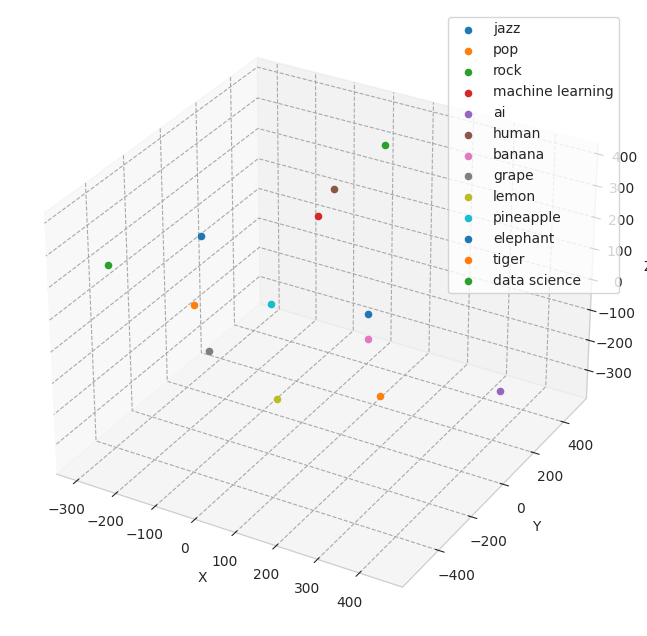

In [ ]:
# Function to generate word vectors and reduce dimensionality
def visualize_word_vectors(words):
    # Tokenize the words and obtain word vectors
    word_vectors = np.array([nl_processor(word).vector for word in words])

    # Reduce dimensionality using t-SNE
    tsne = TSNE(n_components=3, perplexity=5, random_state=42, n_iter=170000)
    word_vectors_3d = tsne.fit_transform(word_vectors)

    return word_vectors_3d

# List of words to visualize
words = ['jazz', 'pop', 'rock', 'machine learning', 'ai', 'human', "banana", "grape", "lemon", "pineapple", "elephant", "tiger", "data science"]

# Generate and visualize word vectors in 3D space
word_vectors_3d = visualize_word_vectors(words)

# Plot the word vectors in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for i, word in enumerate(words):
    ax.scatter(word_vectors_3d[i, 0], word_vectors_3d[i, 1], word_vectors_3d[i, 2], label=word)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.legend()
plt.show()

In [ ]:
def plot_word_vectors_3d(word_vectors_3d, words):
    # Create a Plotly Scatter3d plot
    fig = go.Figure(
        data = [
            go.Scatter3d(
                x = word_vectors_3d[:, 0],
                y = word_vectors_3d[:, 1],
                z = word_vectors_3d[:, 2],
                text = words,
                mode = 'text+markers',
                marker = dict(
                    size = 5,
                    color = 'blue',
                    opacity = 0.8
                ),
                line=None
            )
        ],
        layout = {
            'height':800,
            'width':800
        }
    )

    # Add labels to the axes
    fig.update_layout(scene=dict(
        xaxis_title='Dimension 1',
        yaxis_title='Dimension 2',
        zaxis_title='Dimension 3'
    ))

    # Show the plot
    fig.show()

# Call the function to plot word vectors in 3D
plot_word_vectors_3d(word_vectors_3d, words)